In [186]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from kaggle_titanic_helpers import *
from sklearn.preprocessing import MinMaxScaler

In [187]:
# Reading in data

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [188]:
# Getting spend cols
spend_cols = ['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

In [189]:
# Checking Null Values
train.isna().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

In [190]:
train_df = basic_prep(train,spend_cols)
test_df = basic_prep(test,spend_cols)

In [191]:
# Fixing CryoSleep
train_df = fill_cryosleep(train_df)
test_df = fill_cryosleep(test_df)

217 Initially
98 After Step 1: Spending Money = No CryoSleep
61 After Step 2: 1 Passenger / Zero Spend = CryoSleep
43 After Step 3: Total Group Spend Zero = CryoSleep
0 After Step 4: Total Group Spend > Zero = No CryoSleep
93 Initially
38 After Step 1: Spending Money = No CryoSleep
23 After Step 2: 1 Passenger / Zero Spend = CryoSleep
16 After Step 3: Total Group Spend Zero = CryoSleep
0 After Step 4: Total Group Spend > Zero = No CryoSleep


In [192]:
# Filling HomePlanet
train_df = fill_homeplanet(train_df)
test_df = fill_homeplanet(test_df)

201 Initially
111 after filling passenger groups
104 after filling Europa decks
63 after filling Earth decks
0 after filling the rest with Earth
87 Initially
46 after filling passenger groups
40 after filling Europa decks
31 after filling Earth decks
0 after filling the rest with Earth


In [301]:
float_cols = list(train.dtypes[train.dtypes==float].index)
object_cols = list(train.dtypes[train.dtypes==object].index)

drop_cols = ['Name', 'PassengerId', 'Cabin']
# change_cols = ['VIP', 'CryoSleep']
for i in drop_cols:
    object_cols.remove(i)

In [302]:
# Checking Null Values...again
train_df.isna().sum()

PassengerId          0
HomePlanet           0
CryoSleep            0
Cabin              199
Destination          0
Age                  0
VIP                  0
RoomService          0
FoodCourt            0
ShoppingMall         0
Spa                  0
VRDeck               0
Name               200
Transported          0
deck                 0
number               0
side                 0
passenger_group      0
num_group            0
total_spend          0
total_spend_max      0
num_group_max        0
surname            200
dtype: int64

In [303]:
# Filling the rest of the values with basic fill
train_df = fill_missing_basic(train_df, float_cols, object_cols, spend_cols)
test_df = fill_missing_basic(test_df, float_cols, object_cols, spend_cols)

In [304]:
train_df.isnull().sum()

PassengerId          0
HomePlanet           0
CryoSleep            0
Cabin              199
Destination          0
Age                  0
VIP                  0
RoomService          0
FoodCourt            0
ShoppingMall         0
Spa                  0
VRDeck               0
Name               200
Transported          0
deck                 0
number               0
side                 0
passenger_group      0
num_group            0
total_spend          0
total_spend_max      0
num_group_max        0
surname            200
dtype: int64

## Using Catboost Algo

In [197]:
from catboost import CatBoostClassifier, Pool
from catboost.utils import get_roc_curve

In [326]:
model = CatBoostClassifier(verbose=False)

In [322]:
object_cols.remove('num_group')
object_cols.remove('number')
object_cols

['HomePlanet',
 'CryoSleep',
 'Destination',
 'VIP',
 'deck',
 'side',
 'passenger_group']

In [323]:
# Creating Train/Test splits

#Split in 75% train and 25% test set
X_train, X_val, y_train, y_val = train_test_split(train_df[object_cols+spend_cols],\
                                         train_df.Transported,test_size = 0.25, random_state= 1984)


In [324]:
# Creating pool dataset to pass into catboost model
catboost_pool_train = Pool(X_train, y_train ,cat_features=object_cols)

In [327]:
# Removing unimportant features
model.select_features(
    catboost_pool_train
    ,features_for_select=list(X_train.columns)
    ,steps=4
    ,num_features_to_select=8
    ,algorithm='RecursiveByShapValues'
    ,shap_calc_type='Exact')

Learning rate set to 0.02294
Step #1 out of 4
Feature #3 eliminated
Step #2 out of 4
Feature #2 eliminated
Step #3 out of 4
Feature #5 eliminated
Step #4 out of 4
Feature #9 eliminated
Train final model


{'selected_features': [0, 1, 4, 6, 7, 8, 10, 11],
 'eliminated_features_names': ['VIP', 'Destination', 'side', 'ShoppingMall'],
 'loss_graph': {'main_indices': [0, 1, 2, 3, 4],
  'removed_features_count': [0, 1, 2, 3, 4],
  'loss_values': [0.3528437160020684,
   0.34685008138608636,
   0.352785782837507,
   0.3474153331166795,
   0.35645745360666603]},
 'eliminated_features': [3, 2, 5, 9],
 'selected_features_names': ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']}

## Model Validation

In [390]:
reduced_features = ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']

reduced_cat_features = ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group']

reduced_num_features = ['RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']

In [329]:
# Creating pool dataset to pass into catboost model
catboost_pool_val = Pool(X_val[reduced_features], y_val ,cat_features=reduced_cat_features)

In [330]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

pred2 = model.predict(catboost_pool_val)

# print accuracy
print("Accuracy: ", accuracy_score(y_val, pred2))

# print precision, recall, F1-score per each class/tag
print(classification_report(y_val, pred2))

# print confusion matrix, check documentation for sorting rows/columns
print(confusion_matrix(y_val, pred2))

Accuracy:  0.7916283348666053
              precision    recall  f1-score   support

           0       0.81      0.77      0.79      1090
           1       0.78      0.82      0.80      1084

    accuracy                           0.79      2174
   macro avg       0.79      0.79      0.79      2174
weighted avg       0.79      0.79      0.79      2174

[[834 256]
 [197 887]]


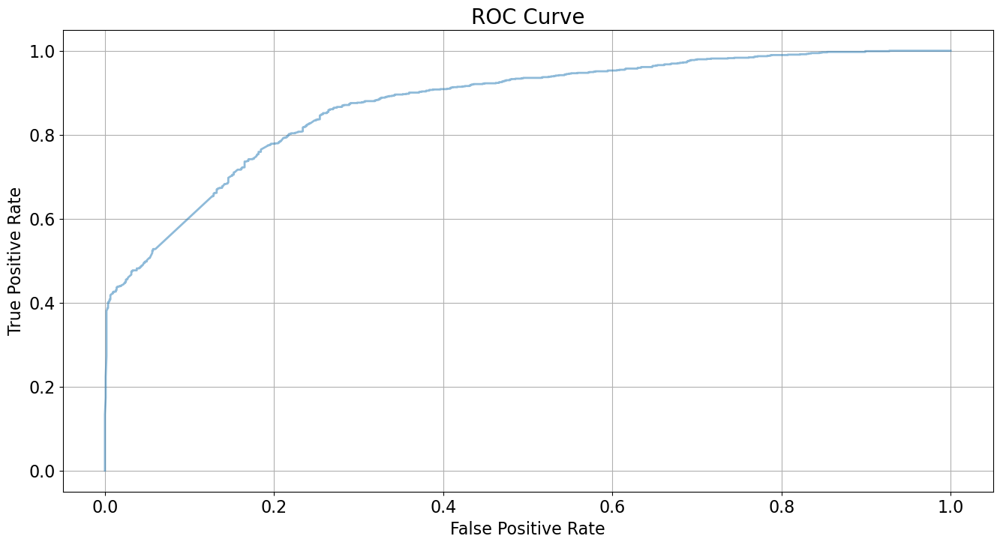

(array([0.        , 0.        , 0.        , ..., 0.99816514, 0.99908257,
        1.        ]),
 array([0.00000000e+00, 9.22509225e-04, 1.84501845e-03, ...,
        1.00000000e+00, 1.00000000e+00, 1.00000000e+00]),
 array([1.00000000e+00, 9.98797693e-01, 9.98280781e-01, ...,
        5.79194531e-04, 3.78919300e-04, 0.00000000e+00]))

In [331]:
from catboost.utils import get_roc_curve

get_roc_curve(model, 
              catboost_pool_val,
              thread_count=-1,
              plot=True)

In [332]:
# Re-training with all data
model = CatBoostClassifier(verbose=False)

In [333]:
catboost_pool_all = Pool(train_df[object_cols+spend_cols], train_df.Transported ,cat_features=object_cols)

In [334]:
# Feature reductions yields same results
model.select_features(
    catboost_pool_all
    ,features_for_select=list(train_df[object_cols+spend_cols].columns)
    ,steps=4
    ,num_features_to_select=8
    ,algorithm='RecursiveByShapValues'
    ,shap_calc_type='Exact')

Learning rate set to 0.025939
Step #1 out of 4
Feature #3 eliminated
Step #2 out of 4
Feature #2 eliminated
Step #3 out of 4
Feature #5 eliminated
Step #4 out of 4
Feature #9 eliminated
Train final model


{'selected_features': [0, 1, 4, 6, 7, 8, 10, 11],
 'eliminated_features_names': ['VIP', 'Destination', 'side', 'ShoppingMall'],
 'loss_graph': {'main_indices': [0, 1, 2, 3, 4],
  'removed_features_count': [0, 1, 2, 3, 4],
  'loss_values': [0.3291354786067554,
   0.3335355807044675,
   0.33897787408765534,
   0.35405240575877706,
   0.3602169719887717]},
 'eliminated_features': [3, 2, 5, 9],
 'selected_features_names': ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']}

In [344]:
catboost_pool_all_red = Pool(train_df[reduced_features], train_df.Transported ,cat_features=reduced_cat_features)

In [345]:
model = CatBoostClassifier(verbose=False)

model.fit(catboost_pool_all_red)

In [335]:
catboost_pool_test = Pool(test_df[reduced_features]
    ,cat_features=reduced_cat_features)

In [346]:
preds_class = model.predict(catboost_pool_test)

In [347]:
pd.merge(test_df['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_submission.csv',index=False)

In [348]:
# catboost_submission.csv
# Complete · Tyler Drumheller · 15s ago
# 0.78559

## GridSearch

In [349]:
catboost_pool_train_red = Pool(X_train[reduced_features],y_train,cat_features=reduced_cat_features)

In [350]:
parameters = {'iterations':(25,50,100),
              'depth':[5,10,20],
              'learning_rate':[.25,.1,.5],
              'l2_leaf_reg': [3,5,10,20]}
algo = CatBoostClassifier()

model_gs = GridSearchCV(algo,parameters,verbose=True,n_jobs=-1)

model_gs.fit(X=X_train[reduced_features],
             y=y_train
        ,cat_features=reduced_cat_features)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
0:	learn: 0.6226320	total: 55.6ms	remaining: 1.33s
1:	learn: 0.5765344	total: 57.4ms	remaining: 660ms
2:	learn: 0.5417511	total: 59ms	remaining: 432ms
3:	learn: 0.5209340	total: 60.7ms	remaining: 319ms
4:	learn: 0.5020161	total: 62.5ms	remaining: 250ms
5:	learn: 0.4858860	total: 64.2ms	remaining: 203ms
6:	learn: 0.4762592	total: 65.8ms	remaining: 169ms
7:	learn: 0.4688380	total: 67.3ms	remaining: 143ms
8:	learn: 0.4629687	total: 68.9ms	remaining: 122ms
9:	learn: 0.4554432	total: 70.5ms	remaining: 106ms
10:	learn: 0.4516095	total: 71.9ms	remaining: 91.5ms
11:	learn: 0.4474790	total: 73.9ms	remaining: 80.1ms
12:	learn: 0.4428283	total: 75.7ms	remaining: 69.9ms
13:	learn: 0.4407930	total: 77.5ms	remaining: 60.9ms
14:	learn: 0.4385215	total: 79.7ms	remaining: 53.1ms
15:	learn: 0.4358025	total: 81.5ms	remaining: 45.9ms
16:	learn: 0.4341392	total: 83.3ms	remaining: 39.2ms
17:	learn: 0.4326479	total: 85ms	remaining: 33.1ms
18:	lea

78:	learn: 0.4028165	total: 161ms	remaining: 42.9ms
79:	learn: 0.4028065	total: 163ms	remaining: 40.8ms
80:	learn: 0.4025744	total: 165ms	remaining: 38.8ms
81:	learn: 0.4020100	total: 167ms	remaining: 36.7ms
82:	learn: 0.4019495	total: 169ms	remaining: 34.6ms
83:	learn: 0.4017585	total: 172ms	remaining: 32.9ms
84:	learn: 0.4006637	total: 174ms	remaining: 30.8ms
85:	learn: 0.4004663	total: 177ms	remaining: 28.8ms
86:	learn: 0.4000049	total: 179ms	remaining: 26.7ms
87:	learn: 0.3999803	total: 182ms	remaining: 24.8ms
88:	learn: 0.3999745	total: 184ms	remaining: 22.7ms
89:	learn: 0.3994464	total: 187ms	remaining: 20.8ms
90:	learn: 0.3993546	total: 189ms	remaining: 18.6ms
91:	learn: 0.3993459	total: 190ms	remaining: 16.5ms
92:	learn: 0.3993010	total: 193ms	remaining: 14.5ms
93:	learn: 0.3992909	total: 195ms	remaining: 12.4ms
94:	learn: 0.3992894	total: 197ms	remaining: 10.4ms
95:	learn: 0.3992880	total: 199ms	remaining: 8.28ms
96:	learn: 0.3992847	total: 201ms	remaining: 6.21ms
97:	learn: 0

78:	learn: 0.3997636	total: 161ms	remaining: 42.9ms
79:	learn: 0.3997064	total: 163ms	remaining: 40.8ms
80:	learn: 0.3996197	total: 165ms	remaining: 38.7ms
81:	learn: 0.3988194	total: 167ms	remaining: 36.7ms
82:	learn: 0.3984549	total: 169ms	remaining: 34.6ms
83:	learn: 0.3983753	total: 171ms	remaining: 32.6ms
84:	learn: 0.3981678	total: 173ms	remaining: 30.6ms
85:	learn: 0.3973995	total: 175ms	remaining: 28.5ms
86:	learn: 0.3967202	total: 177ms	remaining: 26.4ms
87:	learn: 0.3966883	total: 178ms	remaining: 24.2ms
88:	learn: 0.3965523	total: 179ms	remaining: 22.2ms
89:	learn: 0.3963409	total: 181ms	remaining: 20.1ms
90:	learn: 0.3963267	total: 184ms	remaining: 18.2ms
91:	learn: 0.3961759	total: 185ms	remaining: 16.1ms
92:	learn: 0.3955414	total: 188ms	remaining: 14.2ms
93:	learn: 0.3950069	total: 190ms	remaining: 12.1ms
94:	learn: 0.3948033	total: 192ms	remaining: 10.1ms
95:	learn: 0.3943426	total: 195ms	remaining: 8.11ms
96:	learn: 0.3942796	total: 196ms	remaining: 6.07ms
97:	learn: 0

77:	learn: 0.4072522	total: 159ms	remaining: 44.8ms
78:	learn: 0.4069637	total: 161ms	remaining: 42.8ms
79:	learn: 0.4066207	total: 163ms	remaining: 40.8ms
80:	learn: 0.4063302	total: 165ms	remaining: 38.7ms
81:	learn: 0.4062927	total: 167ms	remaining: 36.8ms
82:	learn: 0.4060786	total: 169ms	remaining: 34.7ms
83:	learn: 0.4060155	total: 171ms	remaining: 32.7ms
84:	learn: 0.4055956	total: 173ms	remaining: 30.6ms
85:	learn: 0.4054024	total: 175ms	remaining: 28.5ms
86:	learn: 0.4051607	total: 177ms	remaining: 26.4ms
87:	learn: 0.4051496	total: 179ms	remaining: 24.4ms
88:	learn: 0.4051325	total: 181ms	remaining: 22.3ms
89:	learn: 0.4050626	total: 183ms	remaining: 20.3ms
90:	learn: 0.4048598	total: 184ms	remaining: 18.2ms
91:	learn: 0.4044927	total: 186ms	remaining: 16.2ms
92:	learn: 0.4044299	total: 189ms	remaining: 14.2ms
93:	learn: 0.4044078	total: 190ms	remaining: 12.1ms
94:	learn: 0.4042906	total: 192ms	remaining: 10.1ms
95:	learn: 0.4042780	total: 196ms	remaining: 8.15ms
96:	learn: 0

42:	learn: 0.4117057	total: 87.1ms	remaining: 115ms
43:	learn: 0.4117041	total: 88.9ms	remaining: 113ms
44:	learn: 0.4114050	total: 90.6ms	remaining: 111ms
45:	learn: 0.4113895	total: 92.4ms	remaining: 108ms
46:	learn: 0.4113874	total: 94.2ms	remaining: 106ms
47:	learn: 0.4110310	total: 96.9ms	remaining: 105ms
48:	learn: 0.4110201	total: 98.7ms	remaining: 103ms
49:	learn: 0.4110132	total: 100ms	remaining: 100ms
50:	learn: 0.4105385	total: 102ms	remaining: 98.3ms
51:	learn: 0.4105363	total: 104ms	remaining: 96.1ms
52:	learn: 0.4105082	total: 106ms	remaining: 93.8ms
53:	learn: 0.4104936	total: 109ms	remaining: 92.5ms
54:	learn: 0.4104812	total: 110ms	remaining: 90.3ms
55:	learn: 0.4104800	total: 112ms	remaining: 88.1ms
56:	learn: 0.4104725	total: 114ms	remaining: 86.2ms
57:	learn: 0.4099733	total: 116ms	remaining: 84.1ms
58:	learn: 0.4099715	total: 121ms	remaining: 84ms
59:	learn: 0.4088007	total: 123ms	remaining: 81.8ms
60:	learn: 0.4087936	total: 124ms	remaining: 79.5ms
61:	learn: 0.40

42:	learn: 0.4151460	total: 96.2ms	remaining: 128ms
43:	learn: 0.4150899	total: 98.1ms	remaining: 125ms
44:	learn: 0.4150443	total: 100ms	remaining: 122ms
45:	learn: 0.4148409	total: 102ms	remaining: 120ms
46:	learn: 0.4148010	total: 106ms	remaining: 120ms
47:	learn: 0.4138928	total: 108ms	remaining: 117ms
48:	learn: 0.4137116	total: 110ms	remaining: 114ms
49:	learn: 0.4135532	total: 112ms	remaining: 112ms
50:	learn: 0.4135202	total: 114ms	remaining: 109ms
51:	learn: 0.4133917	total: 116ms	remaining: 107ms
52:	learn: 0.4133645	total: 118ms	remaining: 105ms
53:	learn: 0.4133132	total: 120ms	remaining: 102ms
54:	learn: 0.4131660	total: 122ms	remaining: 99.6ms
55:	learn: 0.4113865	total: 124ms	remaining: 97.3ms
56:	learn: 0.4101677	total: 125ms	remaining: 94.5ms
57:	learn: 0.4099037	total: 128ms	remaining: 92.7ms
58:	learn: 0.4096375	total: 130ms	remaining: 90.4ms
59:	learn: 0.4096070	total: 132ms	remaining: 88ms
60:	learn: 0.4095524	total: 134ms	remaining: 85.6ms
61:	learn: 0.4087810	tot

43:	learn: 0.4505837	total: 86.6ms	remaining: 110ms
44:	learn: 0.4497476	total: 88.4ms	remaining: 108ms
45:	learn: 0.4490627	total: 90.3ms	remaining: 106ms
46:	learn: 0.4484775	total: 92.5ms	remaining: 104ms
47:	learn: 0.4478616	total: 94.1ms	remaining: 102ms
48:	learn: 0.4471823	total: 95.5ms	remaining: 99.4ms
49:	learn: 0.4464668	total: 97.3ms	remaining: 97.3ms
50:	learn: 0.4459868	total: 99.1ms	remaining: 95.2ms
51:	learn: 0.4457635	total: 100ms	remaining: 92.6ms
52:	learn: 0.4441760	total: 103ms	remaining: 91.1ms
53:	learn: 0.4431202	total: 104ms	remaining: 89ms
54:	learn: 0.4426631	total: 106ms	remaining: 87ms
55:	learn: 0.4422392	total: 109ms	remaining: 85.6ms
56:	learn: 0.4416384	total: 111ms	remaining: 83.6ms
57:	learn: 0.4411780	total: 114ms	remaining: 82.2ms
58:	learn: 0.4410060	total: 114ms	remaining: 79.6ms
59:	learn: 0.4406988	total: 116ms	remaining: 77.5ms
60:	learn: 0.4402405	total: 118ms	remaining: 75.4ms
61:	learn: 0.4390850	total: 120ms	remaining: 73.4ms
62:	learn: 0.

39:	learn: 0.4171304	total: 85.7ms	remaining: 129ms
40:	learn: 0.4171199	total: 87.5ms	remaining: 126ms
41:	learn: 0.4166618	total: 89.3ms	remaining: 123ms
42:	learn: 0.4166491	total: 90.9ms	remaining: 121ms
43:	learn: 0.4159576	total: 92.7ms	remaining: 118ms
44:	learn: 0.4159410	total: 94.4ms	remaining: 115ms
45:	learn: 0.4159267	total: 97.1ms	remaining: 114ms
46:	learn: 0.4137890	total: 99.3ms	remaining: 112ms
47:	learn: 0.4134498	total: 101ms	remaining: 109ms
48:	learn: 0.4134249	total: 103ms	remaining: 107ms
49:	learn: 0.4134084	total: 105ms	remaining: 105ms
50:	learn: 0.4134012	total: 107ms	remaining: 103ms
51:	learn: 0.4125467	total: 108ms	remaining: 100ms
52:	learn: 0.4125350	total: 110ms	remaining: 97.6ms
53:	learn: 0.4124914	total: 112ms	remaining: 95.3ms
54:	learn: 0.4124793	total: 114ms	remaining: 93ms
55:	learn: 0.4124678	total: 115ms	remaining: 90.6ms
56:	learn: 0.4124277	total: 117ms	remaining: 88.3ms
57:	learn: 0.4124164	total: 120ms	remaining: 87.1ms
58:	learn: 0.412409

20:	learn: 0.4180763	total: 244ms	remaining: 338ms
21:	learn: 0.4169707	total: 263ms	remaining: 335ms
22:	learn: 0.4162175	total: 280ms	remaining: 328ms
23:	learn: 0.4145175	total: 298ms	remaining: 323ms
24:	learn: 0.4127939	total: 316ms	remaining: 316ms
25:	learn: 0.4120149	total: 333ms	remaining: 308ms
26:	learn: 0.4110652	total: 348ms	remaining: 297ms
27:	learn: 0.4090213	total: 365ms	remaining: 287ms
28:	learn: 0.4079523	total: 380ms	remaining: 275ms
29:	learn: 0.4073292	total: 396ms	remaining: 264ms
30:	learn: 0.4068203	total: 413ms	remaining: 253ms
31:	learn: 0.4057063	total: 427ms	remaining: 240ms
32:	learn: 0.4051762	total: 445ms	remaining: 229ms
33:	learn: 0.4041944	total: 457ms	remaining: 215ms
34:	learn: 0.4035376	total: 470ms	remaining: 202ms
35:	learn: 0.4022318	total: 488ms	remaining: 190ms
36:	learn: 0.4014596	total: 503ms	remaining: 177ms
37:	learn: 0.4006686	total: 518ms	remaining: 164ms
38:	learn: 0.3997210	total: 533ms	remaining: 150ms
39:	learn: 0.3986505	total: 549

20:	learn: 0.4102987	total: 296ms	remaining: 1.11s
21:	learn: 0.4090565	total: 313ms	remaining: 1.11s
22:	learn: 0.4081908	total: 316ms	remaining: 1.06s
23:	learn: 0.4071862	total: 332ms	remaining: 1.05s
24:	learn: 0.4061403	total: 361ms	remaining: 1.08s
25:	learn: 0.4039827	total: 380ms	remaining: 1.08s
26:	learn: 0.4030289	total: 398ms	remaining: 1.07s
27:	learn: 0.4019248	total: 429ms	remaining: 1.1s
28:	learn: 0.4014826	total: 431ms	remaining: 1.05s
29:	learn: 0.4006537	total: 446ms	remaining: 1.04s
30:	learn: 0.3986382	total: 459ms	remaining: 1.02s
31:	learn: 0.3983406	total: 460ms	remaining: 978ms
32:	learn: 0.3975817	total: 476ms	remaining: 966ms
33:	learn: 0.3966175	total: 490ms	remaining: 951ms
34:	learn: 0.3952528	total: 510ms	remaining: 947ms
35:	learn: 0.3948118	total: 526ms	remaining: 935ms
36:	learn: 0.3941254	total: 550ms	remaining: 937ms
37:	learn: 0.3927149	total: 567ms	remaining: 925ms
38:	learn: 0.3913455	total: 588ms	remaining: 920ms
39:	learn: 0.3898777	total: 603m

/Users/tylerdrumheller/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
180 fits failed out of a total of 540.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
180 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tylerdrumheller/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tylerdrumheller/anaconda3/lib/python3.10/site-packages/catboost/core.py", line 5128, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/Users/tylerdr

0:	learn: 0.6236454	total: 2ms	remaining: 198ms
1:	learn: 0.5797502	total: 3.82ms	remaining: 187ms
2:	learn: 0.5511530	total: 5.33ms	remaining: 172ms
3:	learn: 0.5276986	total: 6.63ms	remaining: 159ms
4:	learn: 0.5105505	total: 7.86ms	remaining: 149ms
5:	learn: 0.4987404	total: 9.14ms	remaining: 143ms
6:	learn: 0.4875993	total: 10.3ms	remaining: 137ms
7:	learn: 0.4763040	total: 11.6ms	remaining: 133ms
8:	learn: 0.4684284	total: 12.8ms	remaining: 129ms
9:	learn: 0.4631723	total: 14ms	remaining: 126ms
10:	learn: 0.4589611	total: 15.1ms	remaining: 122ms
11:	learn: 0.4560021	total: 16.3ms	remaining: 120ms
12:	learn: 0.4522830	total: 17.5ms	remaining: 117ms
13:	learn: 0.4499455	total: 18.6ms	remaining: 114ms
14:	learn: 0.4475168	total: 19.8ms	remaining: 112ms
15:	learn: 0.4451974	total: 21.1ms	remaining: 111ms
16:	learn: 0.4431503	total: 22.3ms	remaining: 109ms
17:	learn: 0.4420959	total: 23.3ms	remaining: 106ms
18:	learn: 0.4399561	total: 24.6ms	remaining: 105ms
19:	learn: 0.4395262	total:

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x7f8be9d9b820>,
             n_jobs=-1,
             param_grid={'depth': [5, 10, 20], 'iterations': (25, 50, 100),
                         'l2_leaf_reg': [3, 5, 10, 20],
                         'learning_rate': [0.25, 0.1, 0.5]},
             verbose=True)

In [351]:
model_gs.best_params_

{'depth': 5, 'iterations': 100, 'l2_leaf_reg': 10, 'learning_rate': 0.25}

In [352]:
pred2 = model_gs.predict(catboost_pool_val)

# print accuracy
print("Accuracy: ", accuracy_score(y_val, pred2))

# print precision, recall, F1-score per each class/tag
print(classification_report(y_val, pred2))

# print confusion matrix, check documentation for sorting rows/columns
print(confusion_matrix(y_val, pred2))

Accuracy:  0.7920883164673413
              precision    recall  f1-score   support

           0       0.82      0.75      0.78      1090
           1       0.77      0.83      0.80      1084

    accuracy                           0.79      2174
   macro avg       0.79      0.79      0.79      2174
weighted avg       0.79      0.79      0.79      2174

[[822 268]
 [184 900]]


In [353]:
# Re-training algo with all data
algo = CatBoostClassifier(iterations=100,depth=5,l2_leaf_reg=10,learning_rate=.25)

algo.fit(catboost_pool_all_red)

0:	learn: 0.6235500	total: 2.43ms	remaining: 241ms
1:	learn: 0.5815679	total: 4.66ms	remaining: 228ms
2:	learn: 0.5497179	total: 6.82ms	remaining: 220ms
3:	learn: 0.5275593	total: 8.52ms	remaining: 204ms
4:	learn: 0.5091676	total: 10.2ms	remaining: 194ms
5:	learn: 0.4960581	total: 11.9ms	remaining: 186ms
6:	learn: 0.4862254	total: 13.6ms	remaining: 181ms
7:	learn: 0.4787097	total: 15.6ms	remaining: 180ms
8:	learn: 0.4693203	total: 17.2ms	remaining: 174ms
9:	learn: 0.4635472	total: 19ms	remaining: 171ms
10:	learn: 0.4600231	total: 20.6ms	remaining: 166ms
11:	learn: 0.4560586	total: 22.3ms	remaining: 164ms
12:	learn: 0.4527572	total: 23.7ms	remaining: 159ms
13:	learn: 0.4508284	total: 25.3ms	remaining: 156ms
14:	learn: 0.4490194	total: 26.9ms	remaining: 153ms
15:	learn: 0.4452853	total: 28.7ms	remaining: 151ms
16:	learn: 0.4433547	total: 30.7ms	remaining: 150ms
17:	learn: 0.4411723	total: 33.2ms	remaining: 151ms
18:	learn: 0.4391851	total: 35.2ms	remaining: 150ms
19:	learn: 0.4378595	tot

In [354]:
preds_class = algo.predict(catboost_pool_test)

In [355]:
pd.merge(test_df['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_gs_submission.csv',index=False)

In [ ]:
# catboost_gs_submission.csv
# Complete · Tyler Drumheller · now
# 0.787

## Trying Catboost with Scaling

In [267]:
from sklearn.preprocessing import MinMaxScaler

In [371]:
reduced_features

['HomePlanet',
 'CryoSleep',
 'deck',
 'passenger_group',
 'RoomService',
 'FoodCourt',
 'Spa',
 'VRDeck']

In [408]:
def scale_num_data(df,numeric_variables,cat_reduced_features):
    
    # define min max scaler
    scaler = MinMaxScaler()
    
    num_df = pd.DataFrame(scaler.fit_transform(df[numeric_variables]),columns=numeric_variables)
    
    return pd.merge(df[cat_reduced_features],num_df,left_index=True,right_index=True,how='left'), num_df
    

In [362]:
scaled_train,num_df = scale_num_data(train_df,spend_cols,reduced_cat_features)

In [384]:
# Creating Train/Test splits

#Split in 75% train and 25% test set
X_train, X_val, y_train, y_val = train_test_split(scaled_train[reduced_features],\
                                         train_df.Transported,test_size = 0.25, random_state= 1984)


In [386]:
X_train

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
1715,Earth,False,F,1826,0.015683,0.007748,0.000089,0.000000
5494,Mars,True,F,5860,0.000000,0.000000,0.000000,0.000000
4763,Earth,False,F,5085,0.000000,0.000503,0.004240,0.000000
4014,Europa,False,C,4278,0.027989,0.124912,0.018833,0.002569
8274,Earth,True,G,8835,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
7846,Europa,True,F,8374,0.000000,0.000000,0.000000,0.000000
5192,Mars,True,F,5538,0.000000,0.000000,0.000000,0.000000
1779,Mars,True,E,1891,0.000000,0.000000,0.000000,0.000000
5887,Mars,True,F,6238,0.000000,0.000000,0.000000,0.000000


In [366]:
parameters = {'iterations':(100,200,500),
              'depth':[2,5,10],
              'learning_rate':[.25,.1,.01,.001],
              'l2_leaf_reg': [3,5,10]}
algo = CatBoostClassifier()

model_gs = GridSearchCV(algo,parameters,verbose=True,n_jobs=-1)

model_gs.fit(X_train
        ,y_train
        ,cat_features=reduced_cat_features)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
0:	learn: 0.6394032	total: 53ms	remaining: 5.25s
1:	learn: 0.6077890	total: 54.3ms	remaining: 2.66s
2:	learn: 0.5867401	total: 55.3ms	remaining: 1.79s
3:	learn: 0.5670210	total: 56.3ms	remaining: 1.35s
4:	learn: 0.5526132	total: 57.4ms	remaining: 1.09s
5:	learn: 0.5406321	total: 58.3ms	remaining: 914ms
6:	learn: 0.5300057	total: 59.6ms	remaining: 792ms
7:	learn: 0.5211438	total: 60.6ms	remaining: 697ms
8:	learn: 0.5143376	total: 62.2ms	remaining: 628ms
9:	learn: 0.5072029	total: 63.3ms	remaining: 570ms
10:	learn: 0.5021329	total: 64.4ms	remaining: 521ms
11:	learn: 0.4969877	total: 65.4ms	remaining: 480ms
12:	learn: 0.4930729	total: 66.7ms	remaining: 446ms
13:	learn: 0.4878478	total: 67.7ms	remaining: 416ms
14:	learn: 0.4839273	total: 68.7ms	remaining: 389ms
15:	learn: 0.4812772	total: 69.6ms	remaining: 366ms
16:	learn: 0.4776970	total: 70.6ms	remaining: 345ms
17:	learn: 0.4742368	total: 71.5ms	remaining: 326ms
18:	learn: 0.

55:	learn: 0.6087182	total: 71.8ms	remaining: 56.4ms
56:	learn: 0.6077517	total: 72.6ms	remaining: 54.8ms
57:	learn: 0.6066535	total: 73.6ms	remaining: 53.3ms
58:	learn: 0.6055713	total: 74.5ms	remaining: 51.8ms
59:	learn: 0.6046579	total: 75.8ms	remaining: 50.5ms
60:	learn: 0.6035805	total: 76.8ms	remaining: 49.1ms
61:	learn: 0.6027452	total: 77.9ms	remaining: 47.7ms
62:	learn: 0.6019439	total: 79ms	remaining: 46.4ms
63:	learn: 0.6008753	total: 80.1ms	remaining: 45.1ms
64:	learn: 0.6000177	total: 81.2ms	remaining: 43.7ms
65:	learn: 0.5991401	total: 82.4ms	remaining: 42.5ms
66:	learn: 0.5981479	total: 83.4ms	remaining: 41.1ms
67:	learn: 0.5972997	total: 84.4ms	remaining: 39.7ms
68:	learn: 0.5964854	total: 85.3ms	remaining: 38.3ms
69:	learn: 0.5956884	total: 86.2ms	remaining: 37ms
70:	learn: 0.5948925	total: 87.2ms	remaining: 35.6ms
71:	learn: 0.5939210	total: 88.1ms	remaining: 34.3ms
72:	learn: 0.5931236	total: 89.1ms	remaining: 32.9ms
73:	learn: 0.5924151	total: 90.1ms	remaining: 31.6

15:	learn: 0.4684438	total: 56.3ms	remaining: 647ms
16:	learn: 0.4657918	total: 59.3ms	remaining: 639ms
17:	learn: 0.4614850	total: 63.7ms	remaining: 644ms
18:	learn: 0.4577580	total: 67.7ms	remaining: 645ms
19:	learn: 0.4566862	total: 71.1ms	remaining: 640ms
20:	learn: 0.4558712	total: 74.2ms	remaining: 633ms
21:	learn: 0.4528901	total: 77.7ms	remaining: 629ms
22:	learn: 0.4513969	total: 81.5ms	remaining: 627ms
23:	learn: 0.4494642	total: 85ms	remaining: 624ms
24:	learn: 0.4482774	total: 88.1ms	remaining: 617ms
25:	learn: 0.4472734	total: 91.5ms	remaining: 612ms
26:	learn: 0.4459443	total: 94.5ms	remaining: 605ms
27:	learn: 0.4447852	total: 97.9ms	remaining: 602ms
28:	learn: 0.4429994	total: 102ms	remaining: 599ms
29:	learn: 0.4413789	total: 104ms	remaining: 590ms
30:	learn: 0.4408700	total: 108ms	remaining: 588ms
31:	learn: 0.4399121	total: 111ms	remaining: 585ms
32:	learn: 0.4390228	total: 114ms	remaining: 579ms
33:	learn: 0.4382358	total: 117ms	remaining: 572ms
34:	learn: 0.4369426

79:	learn: 0.4218087	total: 251ms	remaining: 377ms
80:	learn: 0.4217324	total: 254ms	remaining: 373ms
81:	learn: 0.4212803	total: 257ms	remaining: 370ms
82:	learn: 0.4210118	total: 260ms	remaining: 367ms
83:	learn: 0.4209901	total: 265ms	remaining: 365ms
84:	learn: 0.4207743	total: 268ms	remaining: 362ms
85:	learn: 0.4205314	total: 270ms	remaining: 358ms
86:	learn: 0.4205087	total: 273ms	remaining: 355ms
87:	learn: 0.4202204	total: 277ms	remaining: 352ms
88:	learn: 0.4198992	total: 280ms	remaining: 350ms
89:	learn: 0.4195203	total: 283ms	remaining: 346ms
90:	learn: 0.4192292	total: 287ms	remaining: 343ms
91:	learn: 0.4189832	total: 290ms	remaining: 341ms
92:	learn: 0.4188330	total: 293ms	remaining: 338ms
93:	learn: 0.4187832	total: 296ms	remaining: 334ms
94:	learn: 0.4187726	total: 299ms	remaining: 331ms
95:	learn: 0.4186337	total: 302ms	remaining: 327ms
96:	learn: 0.4184572	total: 305ms	remaining: 324ms
97:	learn: 0.4184233	total: 309ms	remaining: 322ms
98:	learn: 0.4181128	total: 312

39:	learn: 0.4661246	total: 127ms	remaining: 1.46s
40:	learn: 0.4646404	total: 130ms	remaining: 1.46s
41:	learn: 0.4638181	total: 134ms	remaining: 1.46s
42:	learn: 0.4626214	total: 136ms	remaining: 1.45s
43:	learn: 0.4614510	total: 139ms	remaining: 1.44s
44:	learn: 0.4605324	total: 143ms	remaining: 1.45s
45:	learn: 0.4598089	total: 146ms	remaining: 1.44s
46:	learn: 0.4587659	total: 149ms	remaining: 1.44s
47:	learn: 0.4578981	total: 152ms	remaining: 1.44s
48:	learn: 0.4571819	total: 155ms	remaining: 1.43s
49:	learn: 0.4567522	total: 158ms	remaining: 1.43s
50:	learn: 0.4564023	total: 162ms	remaining: 1.43s
51:	learn: 0.4555569	total: 165ms	remaining: 1.42s
52:	learn: 0.4545336	total: 168ms	remaining: 1.42s
53:	learn: 0.4536211	total: 170ms	remaining: 1.41s
54:	learn: 0.4526600	total: 174ms	remaining: 1.4s
55:	learn: 0.4518968	total: 177ms	remaining: 1.4s
56:	learn: 0.4512605	total: 180ms	remaining: 1.4s
57:	learn: 0.4508418	total: 183ms	remaining: 1.4s
58:	learn: 0.4504632	total: 186ms	r

43:	learn: 0.4363855	total: 138ms	remaining: 1.43s
44:	learn: 0.4352578	total: 141ms	remaining: 1.43s
45:	learn: 0.4347091	total: 145ms	remaining: 1.43s
46:	learn: 0.4337435	total: 149ms	remaining: 1.44s
47:	learn: 0.4331072	total: 153ms	remaining: 1.44s
48:	learn: 0.4326571	total: 156ms	remaining: 1.43s
49:	learn: 0.4323711	total: 158ms	remaining: 1.43s
50:	learn: 0.4315973	total: 161ms	remaining: 1.42s
51:	learn: 0.4310502	total: 164ms	remaining: 1.42s
52:	learn: 0.4308243	total: 168ms	remaining: 1.42s
53:	learn: 0.4305845	total: 172ms	remaining: 1.42s
54:	learn: 0.4300958	total: 175ms	remaining: 1.41s
55:	learn: 0.4298201	total: 177ms	remaining: 1.4s
56:	learn: 0.4284909	total: 179ms	remaining: 1.39s
57:	learn: 0.4283365	total: 182ms	remaining: 1.39s
58:	learn: 0.4278421	total: 185ms	remaining: 1.38s
59:	learn: 0.4257405	total: 188ms	remaining: 1.38s
60:	learn: 0.4253448	total: 192ms	remaining: 1.38s
61:	learn: 0.4242189	total: 195ms	remaining: 1.38s
62:	learn: 0.4241467	total: 198m

301:	learn: 0.6192103	total: 849ms	remaining: 557ms
302:	learn: 0.6190619	total: 852ms	remaining: 554ms
303:	learn: 0.6188868	total: 854ms	remaining: 551ms
304:	learn: 0.6186835	total: 857ms	remaining: 548ms
305:	learn: 0.6185070	total: 860ms	remaining: 545ms
306:	learn: 0.6183615	total: 862ms	remaining: 542ms
307:	learn: 0.6181811	total: 864ms	remaining: 539ms
308:	learn: 0.6180031	total: 867ms	remaining: 536ms
309:	learn: 0.6178580	total: 870ms	remaining: 533ms
310:	learn: 0.6177164	total: 872ms	remaining: 530ms
311:	learn: 0.6175400	total: 875ms	remaining: 527ms
312:	learn: 0.6173953	total: 877ms	remaining: 524ms
313:	learn: 0.6172447	total: 881ms	remaining: 522ms
314:	learn: 0.6171159	total: 883ms	remaining: 519ms
315:	learn: 0.6169497	total: 886ms	remaining: 516ms
316:	learn: 0.6168217	total: 888ms	remaining: 513ms
317:	learn: 0.6166460	total: 891ms	remaining: 510ms
318:	learn: 0.6165064	total: 894ms	remaining: 507ms
319:	learn: 0.6163603	total: 897ms	remaining: 504ms
320:	learn: 

304:	learn: 0.4869749	total: 966ms	remaining: 618ms
305:	learn: 0.4868156	total: 971ms	remaining: 616ms
306:	learn: 0.4866415	total: 973ms	remaining: 612ms
307:	learn: 0.4864414	total: 976ms	remaining: 609ms
308:	learn: 0.4862771	total: 980ms	remaining: 606ms
309:	learn: 0.4860914	total: 982ms	remaining: 602ms
310:	learn: 0.4859339	total: 985ms	remaining: 599ms
311:	learn: 0.4857963	total: 989ms	remaining: 596ms
312:	learn: 0.4855778	total: 992ms	remaining: 593ms
313:	learn: 0.4854325	total: 998ms	remaining: 591ms
314:	learn: 0.4852613	total: 1s	remaining: 588ms
315:	learn: 0.4850623	total: 1s	remaining: 585ms
316:	learn: 0.4848559	total: 1.01s	remaining: 582ms
317:	learn: 0.4846348	total: 1.01s	remaining: 579ms
318:	learn: 0.4844350	total: 1.01s	remaining: 576ms
319:	learn: 0.4842603	total: 1.02s	remaining: 572ms
320:	learn: 0.4840851	total: 1.02s	remaining: 570ms
321:	learn: 0.4839236	total: 1.02s	remaining: 566ms
322:	learn: 0.4837759	total: 1.03s	remaining: 563ms
323:	learn: 0.4835

61:	learn: 0.4280036	total: 209ms	remaining: 1.48s
62:	learn: 0.4274430	total: 213ms	remaining: 1.48s
63:	learn: 0.4268584	total: 216ms	remaining: 1.47s
64:	learn: 0.4262145	total: 220ms	remaining: 1.47s
65:	learn: 0.4260739	total: 224ms	remaining: 1.47s
66:	learn: 0.4260480	total: 227ms	remaining: 1.47s
67:	learn: 0.4260054	total: 230ms	remaining: 1.46s
68:	learn: 0.4259554	total: 235ms	remaining: 1.47s
69:	learn: 0.4255078	total: 237ms	remaining: 1.46s
70:	learn: 0.4253381	total: 240ms	remaining: 1.45s
71:	learn: 0.4252155	total: 243ms	remaining: 1.44s
72:	learn: 0.4250996	total: 246ms	remaining: 1.44s
73:	learn: 0.4244741	total: 250ms	remaining: 1.44s
74:	learn: 0.4241665	total: 253ms	remaining: 1.43s
75:	learn: 0.4239933	total: 256ms	remaining: 1.43s
76:	learn: 0.4238970	total: 259ms	remaining: 1.42s
77:	learn: 0.4238572	total: 261ms	remaining: 1.41s
78:	learn: 0.4238291	total: 265ms	remaining: 1.41s
79:	learn: 0.4236960	total: 267ms	remaining: 1.4s
80:	learn: 0.4236116	total: 269m

61:	learn: 0.4428382	total: 193ms	remaining: 1.36s
62:	learn: 0.4423764	total: 196ms	remaining: 1.36s
63:	learn: 0.4421481	total: 199ms	remaining: 1.35s
64:	learn: 0.4417540	total: 204ms	remaining: 1.36s
65:	learn: 0.4412058	total: 206ms	remaining: 1.36s
66:	learn: 0.4405177	total: 209ms	remaining: 1.35s
67:	learn: 0.4399466	total: 212ms	remaining: 1.35s
68:	learn: 0.4393551	total: 215ms	remaining: 1.34s
69:	learn: 0.4390627	total: 218ms	remaining: 1.34s
70:	learn: 0.4383885	total: 222ms	remaining: 1.34s
71:	learn: 0.4381704	total: 225ms	remaining: 1.34s
72:	learn: 0.4380806	total: 228ms	remaining: 1.33s
73:	learn: 0.4376757	total: 231ms	remaining: 1.33s
74:	learn: 0.4372607	total: 234ms	remaining: 1.32s
75:	learn: 0.4370995	total: 237ms	remaining: 1.32s
76:	learn: 0.4365321	total: 240ms	remaining: 1.32s
77:	learn: 0.4362424	total: 243ms	remaining: 1.32s
78:	learn: 0.4358678	total: 247ms	remaining: 1.31s
79:	learn: 0.4356523	total: 249ms	remaining: 1.31s
80:	learn: 0.4352860	total: 253

324:	learn: 0.4802876	total: 1.01s	remaining: 543ms
325:	learn: 0.4800991	total: 1.01s	remaining: 540ms
326:	learn: 0.4798944	total: 1.01s	remaining: 537ms
327:	learn: 0.4797156	total: 1.02s	remaining: 535ms
328:	learn: 0.4795698	total: 1.02s	remaining: 532ms
329:	learn: 0.4794125	total: 1.02s	remaining: 528ms
330:	learn: 0.4792864	total: 1.03s	remaining: 525ms
331:	learn: 0.4790925	total: 1.03s	remaining: 522ms
332:	learn: 0.4788705	total: 1.03s	remaining: 519ms
333:	learn: 0.4787149	total: 1.04s	remaining: 516ms
334:	learn: 0.4785657	total: 1.04s	remaining: 513ms
335:	learn: 0.4784206	total: 1.04s	remaining: 510ms
336:	learn: 0.4782925	total: 1.05s	remaining: 507ms
337:	learn: 0.4781583	total: 1.05s	remaining: 504ms
338:	learn: 0.4780114	total: 1.05s	remaining: 501ms
339:	learn: 0.4778573	total: 1.06s	remaining: 497ms
340:	learn: 0.4777211	total: 1.06s	remaining: 494ms
341:	learn: 0.4775393	total: 1.06s	remaining: 491ms
342:	learn: 0.4773772	total: 1.06s	remaining: 488ms
343:	learn: 

322:	learn: 0.4838057	total: 1.01s	remaining: 555ms
323:	learn: 0.4836325	total: 1.02s	remaining: 552ms
324:	learn: 0.4834674	total: 1.02s	remaining: 549ms
325:	learn: 0.4833192	total: 1.02s	remaining: 546ms
326:	learn: 0.4831442	total: 1.03s	remaining: 543ms
327:	learn: 0.4830445	total: 1.03s	remaining: 540ms
328:	learn: 0.4828807	total: 1.03s	remaining: 537ms
329:	learn: 0.4827059	total: 1.03s	remaining: 534ms
330:	learn: 0.4826285	total: 1.04s	remaining: 531ms
331:	learn: 0.4824866	total: 1.04s	remaining: 527ms
332:	learn: 0.4823477	total: 1.04s	remaining: 524ms
333:	learn: 0.4821249	total: 1.05s	remaining: 521ms
334:	learn: 0.4819821	total: 1.05s	remaining: 517ms
335:	learn: 0.4818435	total: 1.05s	remaining: 514ms
336:	learn: 0.4817221	total: 1.06s	remaining: 511ms
337:	learn: 0.4815649	total: 1.06s	remaining: 508ms
338:	learn: 0.4813926	total: 1.06s	remaining: 505ms
339:	learn: 0.4812134	total: 1.07s	remaining: 502ms
340:	learn: 0.4810309	total: 1.07s	remaining: 499ms
341:	learn: 

82:	learn: 0.4210118	total: 261ms	remaining: 1.31s
83:	learn: 0.4209901	total: 265ms	remaining: 1.31s
84:	learn: 0.4207743	total: 268ms	remaining: 1.31s
85:	learn: 0.4205314	total: 272ms	remaining: 1.31s
86:	learn: 0.4205087	total: 275ms	remaining: 1.3s
87:	learn: 0.4202204	total: 278ms	remaining: 1.3s
88:	learn: 0.4198992	total: 282ms	remaining: 1.3s
89:	learn: 0.4195203	total: 285ms	remaining: 1.3s
90:	learn: 0.4192292	total: 288ms	remaining: 1.29s
91:	learn: 0.4189832	total: 291ms	remaining: 1.29s
92:	learn: 0.4188330	total: 294ms	remaining: 1.29s
93:	learn: 0.4187832	total: 296ms	remaining: 1.28s
94:	learn: 0.4187726	total: 300ms	remaining: 1.28s
95:	learn: 0.4186337	total: 302ms	remaining: 1.27s
96:	learn: 0.4184572	total: 306ms	remaining: 1.27s
97:	learn: 0.4184233	total: 309ms	remaining: 1.27s
98:	learn: 0.4181128	total: 312ms	remaining: 1.26s
99:	learn: 0.4180692	total: 314ms	remaining: 1.26s
100:	learn: 0.4178316	total: 318ms	remaining: 1.25s
101:	learn: 0.4177909	total: 320ms

83:	learn: 0.4360335	total: 292ms	remaining: 1.45s
84:	learn: 0.4356470	total: 296ms	remaining: 1.44s
85:	learn: 0.4351812	total: 302ms	remaining: 1.45s
86:	learn: 0.4347540	total: 305ms	remaining: 1.45s
87:	learn: 0.4345065	total: 312ms	remaining: 1.46s
88:	learn: 0.4341839	total: 315ms	remaining: 1.45s
89:	learn: 0.4335902	total: 318ms	remaining: 1.45s
90:	learn: 0.4331839	total: 323ms	remaining: 1.45s
91:	learn: 0.4328248	total: 327ms	remaining: 1.45s
92:	learn: 0.4325871	total: 330ms	remaining: 1.44s
93:	learn: 0.4321945	total: 333ms	remaining: 1.44s
94:	learn: 0.4320798	total: 337ms	remaining: 1.44s
95:	learn: 0.4316096	total: 341ms	remaining: 1.44s
96:	learn: 0.4312315	total: 344ms	remaining: 1.43s
97:	learn: 0.4308657	total: 347ms	remaining: 1.42s
98:	learn: 0.4305567	total: 350ms	remaining: 1.42s
99:	learn: 0.4302585	total: 353ms	remaining: 1.41s
100:	learn: 0.4301283	total: 356ms	remaining: 1.41s
101:	learn: 0.4298222	total: 359ms	remaining: 1.4s
102:	learn: 0.4294470	total: 3

343:	learn: 0.4758922	total: 1.1s	remaining: 497ms
344:	learn: 0.4757828	total: 1.1s	remaining: 494ms
345:	learn: 0.4756561	total: 1.1s	remaining: 491ms
346:	learn: 0.4755628	total: 1.1s	remaining: 488ms
347:	learn: 0.4753611	total: 1.11s	remaining: 485ms
348:	learn: 0.4752551	total: 1.11s	remaining: 482ms
349:	learn: 0.4751124	total: 1.12s	remaining: 479ms
350:	learn: 0.4749862	total: 1.12s	remaining: 475ms
351:	learn: 0.4748588	total: 1.12s	remaining: 472ms
352:	learn: 0.4747441	total: 1.13s	remaining: 469ms
353:	learn: 0.4746976	total: 1.13s	remaining: 466ms
354:	learn: 0.4745425	total: 1.13s	remaining: 463ms
355:	learn: 0.4744813	total: 1.14s	remaining: 459ms
356:	learn: 0.4743644	total: 1.14s	remaining: 456ms
357:	learn: 0.4741702	total: 1.14s	remaining: 453ms
358:	learn: 0.4740258	total: 1.15s	remaining: 450ms
359:	learn: 0.4739060	total: 1.15s	remaining: 447ms
360:	learn: 0.4737742	total: 1.15s	remaining: 444ms
361:	learn: 0.4736347	total: 1.16s	remaining: 441ms
362:	learn: 0.47

344:	learn: 0.4806178	total: 1.11s	remaining: 501ms
345:	learn: 0.4804361	total: 1.12s	remaining: 498ms
346:	learn: 0.4802874	total: 1.12s	remaining: 494ms
347:	learn: 0.4801472	total: 1.12s	remaining: 491ms
348:	learn: 0.4800072	total: 1.13s	remaining: 488ms
349:	learn: 0.4799030	total: 1.13s	remaining: 485ms
350:	learn: 0.4797217	total: 1.13s	remaining: 481ms
351:	learn: 0.4795592	total: 1.14s	remaining: 478ms
352:	learn: 0.4794016	total: 1.14s	remaining: 475ms
353:	learn: 0.4792517	total: 1.14s	remaining: 471ms
354:	learn: 0.4790505	total: 1.15s	remaining: 468ms
355:	learn: 0.4788251	total: 1.15s	remaining: 465ms
356:	learn: 0.4787168	total: 1.15s	remaining: 462ms
357:	learn: 0.4785403	total: 1.16s	remaining: 458ms
358:	learn: 0.4784221	total: 1.16s	remaining: 455ms
359:	learn: 0.4782756	total: 1.16s	remaining: 452ms
360:	learn: 0.4781473	total: 1.17s	remaining: 449ms
361:	learn: 0.4780539	total: 1.17s	remaining: 445ms
362:	learn: 0.4779307	total: 1.17s	remaining: 443ms
363:	learn: 

5:	learn: 0.4983942	total: 12.8ms	remaining: 200ms
6:	learn: 0.4828065	total: 14.4ms	remaining: 191ms
7:	learn: 0.4731708	total: 17.3ms	remaining: 199ms
8:	learn: 0.4695997	total: 18.6ms	remaining: 188ms
9:	learn: 0.4632387	total: 20.5ms	remaining: 185ms
10:	learn: 0.4568329	total: 22.3ms	remaining: 180ms
11:	learn: 0.4535057	total: 24.2ms	remaining: 178ms
12:	learn: 0.4475605	total: 26.1ms	remaining: 174ms
13:	learn: 0.4442313	total: 28.3ms	remaining: 174ms
14:	learn: 0.4419150	total: 30.2ms	remaining: 171ms
15:	learn: 0.4398003	total: 32.2ms	remaining: 169ms
16:	learn: 0.4383679	total: 34.1ms	remaining: 166ms
17:	learn: 0.4349925	total: 35.9ms	remaining: 164ms
18:	learn: 0.4332582	total: 40.4ms	remaining: 172ms
19:	learn: 0.4328380	total: 41.7ms	remaining: 167ms
20:	learn: 0.4320662	total: 43.4ms	remaining: 163ms
21:	learn: 0.4307468	total: 45.3ms	remaining: 160ms
22:	learn: 0.4294394	total: 46.9ms	remaining: 157ms
23:	learn: 0.4277590	total: 49ms	remaining: 155ms
24:	learn: 0.426608

9:	learn: 0.5263468	total: 21.5ms	remaining: 194ms
10:	learn: 0.5191742	total: 24ms	remaining: 195ms
11:	learn: 0.5122032	total: 25.9ms	remaining: 190ms
12:	learn: 0.5059615	total: 27.7ms	remaining: 186ms
13:	learn: 0.4996689	total: 29.6ms	remaining: 182ms
14:	learn: 0.4948142	total: 31.4ms	remaining: 178ms
15:	learn: 0.4898902	total: 33.4ms	remaining: 176ms
16:	learn: 0.4845693	total: 35ms	remaining: 171ms
17:	learn: 0.4802550	total: 36.9ms	remaining: 168ms
18:	learn: 0.4762958	total: 38.7ms	remaining: 165ms
19:	learn: 0.4734361	total: 40.5ms	remaining: 162ms
20:	learn: 0.4699478	total: 42.3ms	remaining: 159ms
21:	learn: 0.4665955	total: 44.2ms	remaining: 157ms
22:	learn: 0.4643497	total: 47ms	remaining: 157ms
23:	learn: 0.4620810	total: 48.9ms	remaining: 155ms
24:	learn: 0.4593817	total: 50.8ms	remaining: 152ms
25:	learn: 0.4568763	total: 52.8ms	remaining: 150ms
26:	learn: 0.4553173	total: 54.6ms	remaining: 148ms
27:	learn: 0.4536163	total: 57.8ms	remaining: 149ms
28:	learn: 0.451967

6:	learn: 0.5633410	total: 14.7ms	remaining: 196ms
7:	learn: 0.5517553	total: 16.6ms	remaining: 190ms
8:	learn: 0.5444840	total: 18.4ms	remaining: 186ms
9:	learn: 0.5358822	total: 22ms	remaining: 198ms
10:	learn: 0.5278210	total: 23.9ms	remaining: 193ms
11:	learn: 0.5191991	total: 25.8ms	remaining: 190ms
12:	learn: 0.5135376	total: 27.7ms	remaining: 186ms
13:	learn: 0.5072276	total: 29.5ms	remaining: 181ms
14:	learn: 0.5022330	total: 31.2ms	remaining: 177ms
15:	learn: 0.4966802	total: 34ms	remaining: 178ms
16:	learn: 0.4923733	total: 35.9ms	remaining: 175ms
17:	learn: 0.4886362	total: 37.9ms	remaining: 173ms
18:	learn: 0.4851668	total: 39.8ms	remaining: 170ms
19:	learn: 0.4819703	total: 41.6ms	remaining: 167ms
20:	learn: 0.4795084	total: 43.6ms	remaining: 164ms
21:	learn: 0.4768857	total: 45.7ms	remaining: 162ms
22:	learn: 0.4745712	total: 47.4ms	remaining: 159ms
23:	learn: 0.4725199	total: 49.3ms	remaining: 156ms
24:	learn: 0.4703678	total: 51.2ms	remaining: 154ms
25:	learn: 0.4678271

174:	learn: 0.3401487	total: 1.02s	remaining: 146ms
175:	learn: 0.3400760	total: 1.02s	remaining: 140ms
176:	learn: 0.3399065	total: 1.03s	remaining: 134ms
177:	learn: 0.3395436	total: 1.04s	remaining: 128ms
178:	learn: 0.3393100	total: 1.04s	remaining: 122ms
179:	learn: 0.3391417	total: 1.05s	remaining: 116ms
180:	learn: 0.3387599	total: 1.05s	remaining: 111ms
181:	learn: 0.3383729	total: 1.06s	remaining: 105ms
182:	learn: 0.3382479	total: 1.07s	remaining: 99.1ms
183:	learn: 0.3380055	total: 1.07s	remaining: 93.4ms
184:	learn: 0.3376167	total: 1.08s	remaining: 87.6ms
185:	learn: 0.3373957	total: 1.09s	remaining: 81.8ms
186:	learn: 0.3373022	total: 1.09s	remaining: 76ms
187:	learn: 0.3369263	total: 1.1s	remaining: 70.2ms
188:	learn: 0.3368081	total: 1.1s	remaining: 64.4ms
189:	learn: 0.3359615	total: 1.11s	remaining: 58.5ms
190:	learn: 0.3355107	total: 1.12s	remaining: 52.7ms
191:	learn: 0.3352750	total: 1.12s	remaining: 46.8ms
192:	learn: 0.3348522	total: 1.13s	remaining: 41.1ms
193:	

70:	learn: 0.4103705	total: 431ms	remaining: 782ms
71:	learn: 0.4102285	total: 436ms	remaining: 775ms
72:	learn: 0.4099216	total: 441ms	remaining: 767ms
73:	learn: 0.4092573	total: 447ms	remaining: 761ms
74:	learn: 0.4091784	total: 451ms	remaining: 752ms
75:	learn: 0.4091276	total: 455ms	remaining: 742ms
76:	learn: 0.4090186	total: 459ms	remaining: 733ms
77:	learn: 0.4085931	total: 466ms	remaining: 728ms
78:	learn: 0.4079020	total: 470ms	remaining: 720ms
79:	learn: 0.4076054	total: 477ms	remaining: 715ms
80:	learn: 0.4071256	total: 482ms	remaining: 709ms
81:	learn: 0.4069990	total: 486ms	remaining: 700ms
82:	learn: 0.4069029	total: 491ms	remaining: 692ms
83:	learn: 0.4063614	total: 497ms	remaining: 686ms
84:	learn: 0.4060345	total: 502ms	remaining: 680ms
85:	learn: 0.4059263	total: 506ms	remaining: 671ms
86:	learn: 0.4055352	total: 513ms	remaining: 666ms
87:	learn: 0.4052218	total: 520ms	remaining: 661ms
88:	learn: 0.4048629	total: 525ms	remaining: 655ms
89:	learn: 0.4044328	total: 532

73:	learn: 0.4070281	total: 420ms	remaining: 715ms
74:	learn: 0.4066236	total: 424ms	remaining: 707ms
75:	learn: 0.4063756	total: 430ms	remaining: 702ms
76:	learn: 0.4062807	total: 435ms	remaining: 694ms
77:	learn: 0.4057025	total: 440ms	remaining: 688ms
78:	learn: 0.4055253	total: 444ms	remaining: 679ms
79:	learn: 0.4055215	total: 446ms	remaining: 669ms
80:	learn: 0.4054982	total: 449ms	remaining: 659ms
81:	learn: 0.4051276	total: 453ms	remaining: 652ms
82:	learn: 0.4051022	total: 456ms	remaining: 643ms
83:	learn: 0.4045074	total: 462ms	remaining: 638ms
84:	learn: 0.4042979	total: 469ms	remaining: 634ms
85:	learn: 0.4041831	total: 474ms	remaining: 628ms
86:	learn: 0.4040939	total: 481ms	remaining: 624ms
87:	learn: 0.4038670	total: 486ms	remaining: 619ms
88:	learn: 0.4036542	total: 492ms	remaining: 613ms
89:	learn: 0.4035352	total: 497ms	remaining: 607ms
90:	learn: 0.4030207	total: 502ms	remaining: 601ms
91:	learn: 0.4028634	total: 507ms	remaining: 596ms
92:	learn: 0.4027057	total: 515

43:	learn: 0.5606843	total: 293ms	remaining: 1.04s
44:	learn: 0.5589066	total: 300ms	remaining: 1.03s
45:	learn: 0.5569413	total: 305ms	remaining: 1.02s
46:	learn: 0.5552581	total: 311ms	remaining: 1.01s
47:	learn: 0.5537628	total: 317ms	remaining: 1s
48:	learn: 0.5516256	total: 335ms	remaining: 1.03s
49:	learn: 0.5498578	total: 341ms	remaining: 1.02s
50:	learn: 0.5484883	total: 348ms	remaining: 1.02s
51:	learn: 0.5466703	total: 355ms	remaining: 1.01s
52:	learn: 0.5451801	total: 361ms	remaining: 1s
53:	learn: 0.5436940	total: 375ms	remaining: 1.01s
54:	learn: 0.5423139	total: 381ms	remaining: 1s
55:	learn: 0.5406123	total: 388ms	remaining: 997ms
56:	learn: 0.5390954	total: 393ms	remaining: 986ms
57:	learn: 0.5385942	total: 397ms	remaining: 972ms
58:	learn: 0.5369940	total: 402ms	remaining: 962ms
59:	learn: 0.5356262	total: 408ms	remaining: 953ms
60:	learn: 0.5342036	total: 415ms	remaining: 946ms
61:	learn: 0.5325128	total: 421ms	remaining: 937ms
62:	learn: 0.5310599	total: 427ms	remain

138:	learn: 0.4648770	total: 839ms	remaining: 368ms
139:	learn: 0.4643013	total: 844ms	remaining: 362ms
140:	learn: 0.4637060	total: 852ms	remaining: 356ms
141:	learn: 0.4633981	total: 858ms	remaining: 350ms
142:	learn: 0.4629265	total: 864ms	remaining: 345ms
143:	learn: 0.4626347	total: 870ms	remaining: 338ms
144:	learn: 0.4622246	total: 877ms	remaining: 333ms
145:	learn: 0.4617717	total: 883ms	remaining: 327ms
146:	learn: 0.4612862	total: 891ms	remaining: 321ms
147:	learn: 0.4609809	total: 898ms	remaining: 316ms
148:	learn: 0.4605324	total: 904ms	remaining: 309ms
149:	learn: 0.4601575	total: 919ms	remaining: 306ms
150:	learn: 0.4597374	total: 926ms	remaining: 301ms
151:	learn: 0.4592772	total: 933ms	remaining: 295ms
152:	learn: 0.4588710	total: 940ms	remaining: 289ms
153:	learn: 0.4584205	total: 947ms	remaining: 283ms
154:	learn: 0.4580674	total: 955ms	remaining: 277ms
155:	learn: 0.4576691	total: 963ms	remaining: 271ms
156:	learn: 0.4573231	total: 969ms	remaining: 265ms
157:	learn: 

141:	learn: 0.4671532	total: 911ms	remaining: 372ms
142:	learn: 0.4667984	total: 917ms	remaining: 366ms
143:	learn: 0.4664212	total: 924ms	remaining: 359ms
144:	learn: 0.4659797	total: 931ms	remaining: 353ms
145:	learn: 0.4655716	total: 937ms	remaining: 347ms
146:	learn: 0.4652112	total: 944ms	remaining: 340ms
147:	learn: 0.4648378	total: 951ms	remaining: 334ms
148:	learn: 0.4643549	total: 956ms	remaining: 327ms
149:	learn: 0.4638652	total: 962ms	remaining: 321ms
150:	learn: 0.4634406	total: 968ms	remaining: 314ms
151:	learn: 0.4630734	total: 976ms	remaining: 308ms
152:	learn: 0.4625673	total: 982ms	remaining: 302ms
153:	learn: 0.4621567	total: 988ms	remaining: 295ms
154:	learn: 0.4617623	total: 994ms	remaining: 289ms
155:	learn: 0.4614726	total: 1s	remaining: 282ms
156:	learn: 0.4611328	total: 1.01s	remaining: 276ms
157:	learn: 0.4607785	total: 1.01s	remaining: 269ms
158:	learn: 0.4604652	total: 1.02s	remaining: 263ms
159:	learn: 0.4600582	total: 1.02s	remaining: 256ms
160:	learn: 0.4

44:	learn: 0.5590017	total: 272ms	remaining: 936ms
45:	learn: 0.5571959	total: 276ms	remaining: 925ms
46:	learn: 0.5552400	total: 282ms	remaining: 917ms
47:	learn: 0.5535385	total: 287ms	remaining: 909ms
48:	learn: 0.5518669	total: 293ms	remaining: 904ms
49:	learn: 0.5503432	total: 299ms	remaining: 897ms
50:	learn: 0.5486240	total: 305ms	remaining: 890ms
51:	learn: 0.5468735	total: 310ms	remaining: 882ms
52:	learn: 0.5455310	total: 315ms	remaining: 875ms
53:	learn: 0.5443651	total: 324ms	remaining: 876ms
54:	learn: 0.5435367	total: 329ms	remaining: 866ms
55:	learn: 0.5419302	total: 336ms	remaining: 863ms
56:	learn: 0.5406424	total: 341ms	remaining: 855ms
57:	learn: 0.5396135	total: 357ms	remaining: 873ms
58:	learn: 0.5385203	total: 362ms	remaining: 865ms
59:	learn: 0.5370899	total: 369ms	remaining: 860ms
60:	learn: 0.5361279	total: 374ms	remaining: 853ms
61:	learn: 0.5350824	total: 380ms	remaining: 847ms
62:	learn: 0.5336389	total: 386ms	remaining: 839ms
63:	learn: 0.5323996	total: 391

111:	learn: 0.6451941	total: 587ms	remaining: 461ms
112:	learn: 0.6448330	total: 592ms	remaining: 456ms
113:	learn: 0.6444589	total: 597ms	remaining: 451ms
114:	learn: 0.6441211	total: 603ms	remaining: 446ms
115:	learn: 0.6437363	total: 608ms	remaining: 441ms
116:	learn: 0.6433446	total: 613ms	remaining: 435ms
117:	learn: 0.6429836	total: 619ms	remaining: 430ms
118:	learn: 0.6426144	total: 625ms	remaining: 425ms
119:	learn: 0.6422502	total: 631ms	remaining: 420ms
120:	learn: 0.6418452	total: 636ms	remaining: 415ms
121:	learn: 0.6414620	total: 642ms	remaining: 410ms
122:	learn: 0.6411588	total: 647ms	remaining: 405ms
123:	learn: 0.6409171	total: 650ms	remaining: 398ms
124:	learn: 0.6405069	total: 657ms	remaining: 394ms
125:	learn: 0.6401174	total: 662ms	remaining: 389ms
126:	learn: 0.6397547	total: 668ms	remaining: 384ms
127:	learn: 0.6393911	total: 673ms	remaining: 378ms
128:	learn: 0.6391101	total: 678ms	remaining: 373ms
129:	learn: 0.6388068	total: 683ms	remaining: 368ms
130:	learn: 

6:	learn: 0.6897177	total: 41.3ms	remaining: 1.14s
7:	learn: 0.6891937	total: 45.2ms	remaining: 1.08s
8:	learn: 0.6887915	total: 49.5ms	remaining: 1.05s
9:	learn: 0.6883719	total: 52.8ms	remaining: 1s
10:	learn: 0.6879063	total: 57.8ms	remaining: 993ms
11:	learn: 0.6874352	total: 62.2ms	remaining: 974ms
12:	learn: 0.6869788	total: 65.8ms	remaining: 947ms
13:	learn: 0.6864508	total: 70.3ms	remaining: 933ms
14:	learn: 0.6859371	total: 74.8ms	remaining: 922ms
15:	learn: 0.6855259	total: 79.4ms	remaining: 913ms
16:	learn: 0.6850746	total: 84.3ms	remaining: 907ms
17:	learn: 0.6845881	total: 88.9ms	remaining: 899ms
18:	learn: 0.6840742	total: 94.4ms	remaining: 899ms
19:	learn: 0.6836165	total: 101ms	remaining: 905ms
20:	learn: 0.6831663	total: 105ms	remaining: 891ms
21:	learn: 0.6826775	total: 110ms	remaining: 891ms
22:	learn: 0.6822442	total: 115ms	remaining: 885ms
23:	learn: 0.6818579	total: 119ms	remaining: 875ms
24:	learn: 0.6814229	total: 124ms	remaining: 871ms
25:	learn: 0.6809949	tota

9:	learn: 0.4333452	total: 63.1ms	remaining: 3.09s
10:	learn: 0.4321691	total: 66.7ms	remaining: 2.97s
11:	learn: 0.4296834	total: 73.2ms	remaining: 2.98s
12:	learn: 0.4253306	total: 79.4ms	remaining: 2.98s
13:	learn: 0.4234163	total: 86.4ms	remaining: 3s
14:	learn: 0.4212415	total: 92.1ms	remaining: 2.98s
15:	learn: 0.4197705	total: 97.2ms	remaining: 2.94s
16:	learn: 0.4180883	total: 103ms	remaining: 2.92s
17:	learn: 0.4172966	total: 110ms	remaining: 2.94s
18:	learn: 0.4163985	total: 116ms	remaining: 2.93s
19:	learn: 0.4148598	total: 121ms	remaining: 2.9s
20:	learn: 0.4131471	total: 126ms	remaining: 2.88s
21:	learn: 0.4125798	total: 132ms	remaining: 2.88s
22:	learn: 0.4112304	total: 137ms	remaining: 2.85s
23:	learn: 0.4100333	total: 144ms	remaining: 2.86s
24:	learn: 0.4091697	total: 150ms	remaining: 2.85s
25:	learn: 0.4085572	total: 156ms	remaining: 2.84s
26:	learn: 0.4081060	total: 161ms	remaining: 2.82s
27:	learn: 0.4077885	total: 167ms	remaining: 2.82s
28:	learn: 0.4070545	total: 1

112:	learn: 0.6465585	total: 585ms	remaining: 450ms
113:	learn: 0.6461645	total: 590ms	remaining: 445ms
114:	learn: 0.6458835	total: 596ms	remaining: 440ms
115:	learn: 0.6455195	total: 603ms	remaining: 437ms
116:	learn: 0.6452213	total: 606ms	remaining: 430ms
117:	learn: 0.6449169	total: 609ms	remaining: 424ms
118:	learn: 0.6446039	total: 613ms	remaining: 417ms
119:	learn: 0.6442613	total: 622ms	remaining: 415ms
120:	learn: 0.6439020	total: 627ms	remaining: 409ms
121:	learn: 0.6436014	total: 632ms	remaining: 404ms
122:	learn: 0.6432094	total: 639ms	remaining: 400ms
123:	learn: 0.6428747	total: 643ms	remaining: 394ms
124:	learn: 0.6425150	total: 649ms	remaining: 389ms
125:	learn: 0.6421145	total: 655ms	remaining: 385ms
126:	learn: 0.6418036	total: 661ms	remaining: 380ms
127:	learn: 0.6414715	total: 666ms	remaining: 374ms
128:	learn: 0.6411217	total: 671ms	remaining: 369ms
129:	learn: 0.6407337	total: 677ms	remaining: 364ms
130:	learn: 0.6403713	total: 682ms	remaining: 359ms
131:	learn: 

73:	learn: 0.5120962	total: 421ms	remaining: 2.42s
74:	learn: 0.5106978	total: 427ms	remaining: 2.42s
75:	learn: 0.5095864	total: 433ms	remaining: 2.42s
76:	learn: 0.5084366	total: 439ms	remaining: 2.41s
77:	learn: 0.5074622	total: 445ms	remaining: 2.41s
78:	learn: 0.5063115	total: 450ms	remaining: 2.4s
79:	learn: 0.5053708	total: 456ms	remaining: 2.39s
80:	learn: 0.5043621	total: 461ms	remaining: 2.38s
81:	learn: 0.5033628	total: 466ms	remaining: 2.38s
82:	learn: 0.5023480	total: 472ms	remaining: 2.37s
83:	learn: 0.5012571	total: 477ms	remaining: 2.36s
84:	learn: 0.5004538	total: 482ms	remaining: 2.35s
85:	learn: 0.4997063	total: 488ms	remaining: 2.35s
86:	learn: 0.4987778	total: 494ms	remaining: 2.34s
87:	learn: 0.4980220	total: 500ms	remaining: 2.34s
88:	learn: 0.4971263	total: 505ms	remaining: 2.33s
89:	learn: 0.4960023	total: 511ms	remaining: 2.33s
90:	learn: 0.4953101	total: 517ms	remaining: 2.33s
91:	learn: 0.4947251	total: 525ms	remaining: 2.33s
92:	learn: 0.4936760	total: 530m

175:	learn: 0.3823084	total: 938ms	remaining: 1.73s
176:	learn: 0.3820666	total: 944ms	remaining: 1.72s
177:	learn: 0.3818107	total: 950ms	remaining: 1.72s
178:	learn: 0.3816194	total: 955ms	remaining: 1.71s
179:	learn: 0.3814876	total: 959ms	remaining: 1.71s
180:	learn: 0.3813285	total: 964ms	remaining: 1.7s
181:	learn: 0.3811209	total: 969ms	remaining: 1.69s
182:	learn: 0.3807135	total: 976ms	remaining: 1.69s
183:	learn: 0.3805299	total: 982ms	remaining: 1.69s
184:	learn: 0.3801872	total: 990ms	remaining: 1.69s
185:	learn: 0.3798173	total: 996ms	remaining: 1.68s
186:	learn: 0.3796334	total: 1s	remaining: 1.68s
187:	learn: 0.3793068	total: 1.01s	remaining: 1.68s
188:	learn: 0.3791412	total: 1.02s	remaining: 1.67s
189:	learn: 0.3787289	total: 1.02s	remaining: 1.67s
190:	learn: 0.3784186	total: 1.03s	remaining: 1.66s
191:	learn: 0.3782992	total: 1.03s	remaining: 1.66s
192:	learn: 0.3782057	total: 1.04s	remaining: 1.65s
193:	learn: 0.3779119	total: 1.04s	remaining: 1.65s
194:	learn: 0.37

275:	learn: 0.3616678	total: 1.57s	remaining: 1.28s
276:	learn: 0.3614441	total: 1.58s	remaining: 1.27s
277:	learn: 0.3612390	total: 1.58s	remaining: 1.27s
278:	learn: 0.3610196	total: 1.59s	remaining: 1.26s
279:	learn: 0.3608865	total: 1.6s	remaining: 1.25s
280:	learn: 0.3607841	total: 1.6s	remaining: 1.25s
281:	learn: 0.3607330	total: 1.61s	remaining: 1.24s
282:	learn: 0.3605233	total: 1.61s	remaining: 1.24s
283:	learn: 0.3602987	total: 1.62s	remaining: 1.23s
284:	learn: 0.3601224	total: 1.63s	remaining: 1.23s
285:	learn: 0.3600048	total: 1.63s	remaining: 1.22s
286:	learn: 0.3598670	total: 1.64s	remaining: 1.22s
287:	learn: 0.3596217	total: 1.65s	remaining: 1.21s
288:	learn: 0.3595130	total: 1.65s	remaining: 1.21s
289:	learn: 0.3594213	total: 1.66s	remaining: 1.2s
290:	learn: 0.3592007	total: 1.66s	remaining: 1.19s
291:	learn: 0.3590979	total: 1.67s	remaining: 1.19s
292:	learn: 0.3588898	total: 1.68s	remaining: 1.18s
293:	learn: 0.3588151	total: 1.68s	remaining: 1.18s
294:	learn: 0.3

339:	learn: 0.5806296	total: 1.81s	remaining: 854ms
340:	learn: 0.5804055	total: 1.82s	remaining: 848ms
341:	learn: 0.5802105	total: 1.82s	remaining: 843ms
342:	learn: 0.5799572	total: 1.83s	remaining: 838ms
343:	learn: 0.5797134	total: 1.83s	remaining: 832ms
344:	learn: 0.5795203	total: 1.84s	remaining: 827ms
345:	learn: 0.5792668	total: 1.84s	remaining: 821ms
346:	learn: 0.5790287	total: 1.85s	remaining: 816ms
347:	learn: 0.5787538	total: 1.85s	remaining: 810ms
348:	learn: 0.5785301	total: 1.86s	remaining: 805ms
349:	learn: 0.5783248	total: 1.86s	remaining: 799ms
350:	learn: 0.5780890	total: 1.87s	remaining: 794ms
351:	learn: 0.5778841	total: 1.88s	remaining: 789ms
352:	learn: 0.5776376	total: 1.88s	remaining: 784ms
353:	learn: 0.5774380	total: 1.89s	remaining: 778ms
354:	learn: 0.5772264	total: 1.89s	remaining: 773ms
355:	learn: 0.5769997	total: 1.9s	remaining: 768ms
356:	learn: 0.5767875	total: 1.91s	remaining: 763ms
357:	learn: 0.5765741	total: 1.91s	remaining: 758ms
358:	learn: 0

40:	learn: 0.4024476	total: 237ms	remaining: 2.65s
41:	learn: 0.4014608	total: 242ms	remaining: 2.64s
42:	learn: 0.4010694	total: 248ms	remaining: 2.63s
43:	learn: 0.4001720	total: 253ms	remaining: 2.62s
44:	learn: 0.3999533	total: 258ms	remaining: 2.61s
45:	learn: 0.3992711	total: 264ms	remaining: 2.6s
46:	learn: 0.3983713	total: 269ms	remaining: 2.59s
47:	learn: 0.3979456	total: 275ms	remaining: 2.58s
48:	learn: 0.3979273	total: 278ms	remaining: 2.56s
49:	learn: 0.3971016	total: 284ms	remaining: 2.55s
50:	learn: 0.3963533	total: 290ms	remaining: 2.55s
51:	learn: 0.3956001	total: 296ms	remaining: 2.55s
52:	learn: 0.3952942	total: 302ms	remaining: 2.55s
53:	learn: 0.3947944	total: 307ms	remaining: 2.54s
54:	learn: 0.3940181	total: 311ms	remaining: 2.52s
55:	learn: 0.3936878	total: 316ms	remaining: 2.51s
56:	learn: 0.3936728	total: 322ms	remaining: 2.5s
57:	learn: 0.3922244	total: 328ms	remaining: 2.5s
58:	learn: 0.3921563	total: 331ms	remaining: 2.48s
59:	learn: 0.3918798	total: 335ms	

440:	learn: 0.5621907	total: 2.41s	remaining: 322ms
441:	learn: 0.5620277	total: 2.41s	remaining: 316ms
442:	learn: 0.5618215	total: 2.42s	remaining: 311ms
443:	learn: 0.5616458	total: 2.42s	remaining: 306ms
444:	learn: 0.5614586	total: 2.43s	remaining: 300ms
445:	learn: 0.5612591	total: 2.43s	remaining: 295ms
446:	learn: 0.5610796	total: 2.44s	remaining: 289ms
447:	learn: 0.5609118	total: 2.45s	remaining: 284ms
448:	learn: 0.5607206	total: 2.45s	remaining: 278ms
449:	learn: 0.5605364	total: 2.46s	remaining: 273ms
450:	learn: 0.5603417	total: 2.46s	remaining: 268ms
451:	learn: 0.5601727	total: 2.47s	remaining: 262ms
452:	learn: 0.5599478	total: 2.47s	remaining: 257ms
453:	learn: 0.5597653	total: 2.48s	remaining: 251ms
454:	learn: 0.5596036	total: 2.48s	remaining: 246ms
455:	learn: 0.5594248	total: 2.49s	remaining: 241ms
456:	learn: 0.5592358	total: 2.5s	remaining: 235ms
457:	learn: 0.5590492	total: 2.5s	remaining: 230ms
458:	learn: 0.5588536	total: 2.51s	remaining: 224ms
459:	learn: 0.

104:	learn: 0.4871733	total: 608ms	remaining: 2.29s
105:	learn: 0.4864722	total: 614ms	remaining: 2.28s
106:	learn: 0.4858529	total: 620ms	remaining: 2.28s
107:	learn: 0.4849697	total: 625ms	remaining: 2.27s
108:	learn: 0.4840162	total: 633ms	remaining: 2.27s
109:	learn: 0.4831244	total: 639ms	remaining: 2.26s
110:	learn: 0.4823381	total: 644ms	remaining: 2.26s
111:	learn: 0.4815471	total: 651ms	remaining: 2.25s
112:	learn: 0.4809958	total: 657ms	remaining: 2.25s
113:	learn: 0.4805444	total: 663ms	remaining: 2.24s
114:	learn: 0.4798815	total: 669ms	remaining: 2.24s
115:	learn: 0.4792499	total: 675ms	remaining: 2.23s
116:	learn: 0.4783894	total: 680ms	remaining: 2.23s
117:	learn: 0.4778420	total: 686ms	remaining: 2.22s
118:	learn: 0.4770618	total: 692ms	remaining: 2.22s
119:	learn: 0.4766101	total: 699ms	remaining: 2.21s
120:	learn: 0.4759161	total: 705ms	remaining: 2.21s
121:	learn: 0.4753606	total: 710ms	remaining: 2.2s
122:	learn: 0.4747810	total: 716ms	remaining: 2.19s
123:	learn: 0

206:	learn: 0.4425114	total: 1.24s	remaining: 1.75s
207:	learn: 0.4423053	total: 1.25s	remaining: 1.75s
208:	learn: 0.4421705	total: 1.25s	remaining: 1.75s
209:	learn: 0.4418825	total: 1.26s	remaining: 1.74s
210:	learn: 0.4415871	total: 1.26s	remaining: 1.73s
211:	learn: 0.4413338	total: 1.27s	remaining: 1.73s
212:	learn: 0.4410996	total: 1.28s	remaining: 1.72s
213:	learn: 0.4409597	total: 1.28s	remaining: 1.72s
214:	learn: 0.4407484	total: 1.29s	remaining: 1.71s
215:	learn: 0.4405436	total: 1.3s	remaining: 1.71s
216:	learn: 0.4403432	total: 1.3s	remaining: 1.7s
217:	learn: 0.4401424	total: 1.31s	remaining: 1.7s
218:	learn: 0.4398406	total: 1.32s	remaining: 1.69s
219:	learn: 0.4396108	total: 1.32s	remaining: 1.68s
220:	learn: 0.4393175	total: 1.33s	remaining: 1.68s
221:	learn: 0.4391405	total: 1.34s	remaining: 1.67s
222:	learn: 0.4389302	total: 1.34s	remaining: 1.67s
223:	learn: 0.4386780	total: 1.35s	remaining: 1.66s
224:	learn: 0.4384416	total: 1.35s	remaining: 1.66s
225:	learn: 0.43

468:	learn: 0.5533858	total: 2.5s	remaining: 165ms
469:	learn: 0.5532356	total: 2.5s	remaining: 160ms
470:	learn: 0.5530686	total: 2.51s	remaining: 155ms
471:	learn: 0.5529020	total: 2.52s	remaining: 149ms
472:	learn: 0.5527461	total: 2.52s	remaining: 144ms
473:	learn: 0.5525899	total: 2.52s	remaining: 138ms
474:	learn: 0.5524059	total: 2.53s	remaining: 133ms
475:	learn: 0.5522392	total: 2.53s	remaining: 128ms
476:	learn: 0.5520717	total: 2.54s	remaining: 122ms
477:	learn: 0.5518869	total: 2.54s	remaining: 117ms
478:	learn: 0.5517388	total: 2.55s	remaining: 112ms
479:	learn: 0.5515968	total: 2.55s	remaining: 106ms
480:	learn: 0.5514550	total: 2.56s	remaining: 101ms
481:	learn: 0.5512947	total: 2.57s	remaining: 95.8ms
482:	learn: 0.5511371	total: 2.57s	remaining: 90.5ms
483:	learn: 0.5509573	total: 2.58s	remaining: 85.2ms
484:	learn: 0.5508169	total: 2.58s	remaining: 79.9ms
485:	learn: 0.5506270	total: 2.59s	remaining: 74.6ms
486:	learn: 0.5504498	total: 2.6s	remaining: 69.3ms
487:	lear

369:	learn: 0.5753292	total: 2.04s	remaining: 719ms
370:	learn: 0.5751254	total: 2.05s	remaining: 714ms
371:	learn: 0.5749106	total: 2.06s	remaining: 708ms
372:	learn: 0.5747087	total: 2.06s	remaining: 703ms
373:	learn: 0.5745298	total: 2.07s	remaining: 697ms
374:	learn: 0.5743690	total: 2.07s	remaining: 692ms
375:	learn: 0.5741765	total: 2.08s	remaining: 686ms
376:	learn: 0.5739860	total: 2.09s	remaining: 681ms
377:	learn: 0.5737648	total: 2.09s	remaining: 675ms
378:	learn: 0.5735831	total: 2.1s	remaining: 669ms
379:	learn: 0.5733914	total: 2.1s	remaining: 664ms
380:	learn: 0.5731807	total: 2.11s	remaining: 658ms
381:	learn: 0.5729653	total: 2.11s	remaining: 653ms
382:	learn: 0.5727747	total: 2.12s	remaining: 647ms
383:	learn: 0.5725753	total: 2.12s	remaining: 641ms
384:	learn: 0.5723571	total: 2.13s	remaining: 635ms
385:	learn: 0.5721950	total: 2.13s	remaining: 630ms
386:	learn: 0.5719879	total: 2.14s	remaining: 624ms
387:	learn: 0.5717580	total: 2.14s	remaining: 618ms
388:	learn: 0.

70:	learn: 0.3936951	total: 348ms	remaining: 2.1s
71:	learn: 0.3936013	total: 351ms	remaining: 2.09s
72:	learn: 0.3932210	total: 356ms	remaining: 2.08s
73:	learn: 0.3930829	total: 362ms	remaining: 2.08s
74:	learn: 0.3924138	total: 368ms	remaining: 2.08s
75:	learn: 0.3916923	total: 375ms	remaining: 2.09s
76:	learn: 0.3914544	total: 379ms	remaining: 2.08s
77:	learn: 0.3908304	total: 385ms	remaining: 2.08s
78:	learn: 0.3902412	total: 392ms	remaining: 2.09s
79:	learn: 0.3900966	total: 398ms	remaining: 2.09s
80:	learn: 0.3891789	total: 404ms	remaining: 2.09s
81:	learn: 0.3888083	total: 409ms	remaining: 2.08s
82:	learn: 0.3887803	total: 414ms	remaining: 2.08s
83:	learn: 0.3876096	total: 421ms	remaining: 2.08s
84:	learn: 0.3864136	total: 426ms	remaining: 2.08s
85:	learn: 0.3861611	total: 433ms	remaining: 2.08s
86:	learn: 0.3861350	total: 438ms	remaining: 2.08s
87:	learn: 0.3860458	total: 442ms	remaining: 2.07s
88:	learn: 0.3858095	total: 447ms	remaining: 2.06s
89:	learn: 0.3856704	total: 454m

234:	learn: 0.3781597	total: 1.27s	remaining: 1.44s
235:	learn: 0.3780350	total: 1.28s	remaining: 1.43s
236:	learn: 0.3779254	total: 1.28s	remaining: 1.43s
237:	learn: 0.3775257	total: 1.29s	remaining: 1.42s
238:	learn: 0.3774575	total: 1.3s	remaining: 1.42s
239:	learn: 0.3774167	total: 1.3s	remaining: 1.41s
240:	learn: 0.3773624	total: 1.31s	remaining: 1.41s
241:	learn: 0.3771258	total: 1.31s	remaining: 1.4s
242:	learn: 0.3770122	total: 1.32s	remaining: 1.4s
243:	learn: 0.3769779	total: 1.33s	remaining: 1.39s
244:	learn: 0.3769372	total: 1.33s	remaining: 1.39s
245:	learn: 0.3768306	total: 1.34s	remaining: 1.38s
246:	learn: 0.3766572	total: 1.34s	remaining: 1.38s
247:	learn: 0.3765386	total: 1.35s	remaining: 1.37s
248:	learn: 0.3764648	total: 1.36s	remaining: 1.37s
249:	learn: 0.3763898	total: 1.36s	remaining: 1.36s
250:	learn: 0.3762331	total: 1.37s	remaining: 1.36s
251:	learn: 0.3760954	total: 1.37s	remaining: 1.35s
252:	learn: 0.3759970	total: 1.38s	remaining: 1.34s
253:	learn: 0.37

135:	learn: 0.4679896	total: 804ms	remaining: 2.15s
136:	learn: 0.4672846	total: 809ms	remaining: 2.14s
137:	learn: 0.4668621	total: 814ms	remaining: 2.13s
138:	learn: 0.4664196	total: 821ms	remaining: 2.13s
139:	learn: 0.4660121	total: 827ms	remaining: 2.13s
140:	learn: 0.4654009	total: 835ms	remaining: 2.12s
141:	learn: 0.4650425	total: 841ms	remaining: 2.12s
142:	learn: 0.4645638	total: 847ms	remaining: 2.11s
143:	learn: 0.4640177	total: 853ms	remaining: 2.11s
144:	learn: 0.4636434	total: 858ms	remaining: 2.1s
145:	learn: 0.4631722	total: 864ms	remaining: 2.1s
146:	learn: 0.4627899	total: 872ms	remaining: 2.09s
147:	learn: 0.4623698	total: 879ms	remaining: 2.09s
148:	learn: 0.4619382	total: 885ms	remaining: 2.08s
149:	learn: 0.4613936	total: 892ms	remaining: 2.08s
150:	learn: 0.4609706	total: 898ms	remaining: 2.07s
151:	learn: 0.4606459	total: 904ms	remaining: 2.07s
152:	learn: 0.4602793	total: 910ms	remaining: 2.06s
153:	learn: 0.4599605	total: 917ms	remaining: 2.06s
154:	learn: 0.

236:	learn: 0.4397290	total: 1.38s	remaining: 1.53s
237:	learn: 0.4395462	total: 1.39s	remaining: 1.53s
238:	learn: 0.4394029	total: 1.39s	remaining: 1.52s
239:	learn: 0.4391861	total: 1.4s	remaining: 1.52s
240:	learn: 0.4389989	total: 1.41s	remaining: 1.51s
241:	learn: 0.4388582	total: 1.41s	remaining: 1.5s
242:	learn: 0.4387552	total: 1.42s	remaining: 1.5s
243:	learn: 0.4385453	total: 1.42s	remaining: 1.49s
244:	learn: 0.4383910	total: 1.43s	remaining: 1.49s
245:	learn: 0.4382064	total: 1.44s	remaining: 1.48s
246:	learn: 0.4380416	total: 1.44s	remaining: 1.48s
247:	learn: 0.4379075	total: 1.45s	remaining: 1.47s
248:	learn: 0.4377333	total: 1.45s	remaining: 1.46s
249:	learn: 0.4375322	total: 1.46s	remaining: 1.46s
250:	learn: 0.4374093	total: 1.46s	remaining: 1.45s
251:	learn: 0.4372787	total: 1.47s	remaining: 1.45s
252:	learn: 0.4370691	total: 1.47s	remaining: 1.44s
253:	learn: 0.4369564	total: 1.48s	remaining: 1.43s
254:	learn: 0.4367900	total: 1.49s	remaining: 1.43s
255:	learn: 0.4

497:	learn: 0.5494962	total: 2.65s	remaining: 10.7ms
498:	learn: 0.5493257	total: 2.66s	remaining: 5.33ms
499:	learn: 0.5492656	total: 2.66s	remaining: 0us
0:	learn: 0.6193375	total: 10.5ms	remaining: 1.04s
1:	learn: 0.5662058	total: 23.8ms	remaining: 1.16s
2:	learn: 0.5304370	total: 36.7ms	remaining: 1.19s
3:	learn: 0.5044764	total: 48.9ms	remaining: 1.17s
4:	learn: 0.4882958	total: 60.5ms	remaining: 1.15s
5:	learn: 0.4773823	total: 62.3ms	remaining: 977ms
6:	learn: 0.4637468	total: 77.3ms	remaining: 1.03s
7:	learn: 0.4539255	total: 89.8ms	remaining: 1.03s
8:	learn: 0.4464872	total: 102ms	remaining: 1.03s
9:	learn: 0.4437810	total: 104ms	remaining: 933ms
10:	learn: 0.4407798	total: 105ms	remaining: 851ms
11:	learn: 0.4359833	total: 119ms	remaining: 874ms
12:	learn: 0.4330747	total: 123ms	remaining: 822ms
13:	learn: 0.4292439	total: 136ms	remaining: 838ms
14:	learn: 0.4263921	total: 151ms	remaining: 854ms
15:	learn: 0.4243228	total: 165ms	remaining: 866ms
16:	learn: 0.4230707	total: 16

0:	learn: 0.6168908	total: 15.2ms	remaining: 1.51s
1:	learn: 0.5682498	total: 21ms	remaining: 1.03s
2:	learn: 0.5337113	total: 30.4ms	remaining: 982ms
3:	learn: 0.5074898	total: 42.9ms	remaining: 1.03s
4:	learn: 0.4872832	total: 58.5ms	remaining: 1.11s
5:	learn: 0.4720423	total: 72.4ms	remaining: 1.14s
6:	learn: 0.4629230	total: 74.5ms	remaining: 990ms
7:	learn: 0.4540448	total: 90.3ms	remaining: 1.04s
8:	learn: 0.4467882	total: 107ms	remaining: 1.08s
9:	learn: 0.4396214	total: 121ms	remaining: 1.09s
10:	learn: 0.4349719	total: 133ms	remaining: 1.08s
11:	learn: 0.4312446	total: 148ms	remaining: 1.08s
12:	learn: 0.4275779	total: 164ms	remaining: 1.1s
13:	learn: 0.4252353	total: 177ms	remaining: 1.08s
14:	learn: 0.4215596	total: 188ms	remaining: 1.07s
15:	learn: 0.4185128	total: 203ms	remaining: 1.06s
16:	learn: 0.4174800	total: 205ms	remaining: 1s
17:	learn: 0.4155239	total: 218ms	remaining: 991ms
18:	learn: 0.4133743	total: 230ms	remaining: 980ms
19:	learn: 0.4116879	total: 244ms	remai

80:	learn: 0.5469166	total: 942ms	remaining: 221ms
81:	learn: 0.5458875	total: 960ms	remaining: 211ms
82:	learn: 0.5447679	total: 973ms	remaining: 199ms
83:	learn: 0.5436908	total: 978ms	remaining: 186ms
84:	learn: 0.5426857	total: 991ms	remaining: 175ms
85:	learn: 0.5415975	total: 999ms	remaining: 163ms
86:	learn: 0.5404999	total: 1.01s	remaining: 151ms
87:	learn: 0.5394555	total: 1.01s	remaining: 138ms
88:	learn: 0.5383476	total: 1.02s	remaining: 126ms
89:	learn: 0.5374250	total: 1.02s	remaining: 114ms
90:	learn: 0.5364469	total: 1.04s	remaining: 103ms
91:	learn: 0.5355082	total: 1.05s	remaining: 91.4ms
92:	learn: 0.5349641	total: 1.05s	remaining: 79.2ms
93:	learn: 0.5340427	total: 1.06s	remaining: 67.9ms
94:	learn: 0.5331236	total: 1.08s	remaining: 56.8ms
95:	learn: 0.5321726	total: 1.09s	remaining: 45.5ms
96:	learn: 0.5312173	total: 1.11s	remaining: 34.3ms
97:	learn: 0.5302729	total: 1.11s	remaining: 22.7ms
98:	learn: 0.5293647	total: 1.13s	remaining: 11.4ms
99:	learn: 0.5285352	to

83:	learn: 0.4176096	total: 1.02s	remaining: 194ms
84:	learn: 0.4172667	total: 1.04s	remaining: 183ms
85:	learn: 0.4171111	total: 1.04s	remaining: 169ms
86:	learn: 0.4168569	total: 1.06s	remaining: 158ms
87:	learn: 0.4166212	total: 1.07s	remaining: 146ms
88:	learn: 0.4163227	total: 1.08s	remaining: 134ms
89:	learn: 0.4159730	total: 1.1s	remaining: 122ms
90:	learn: 0.4157712	total: 1.11s	remaining: 110ms
91:	learn: 0.4154416	total: 1.13s	remaining: 97.9ms
92:	learn: 0.4148525	total: 1.15s	remaining: 86.3ms
93:	learn: 0.4146770	total: 1.16s	remaining: 74.2ms
94:	learn: 0.4145134	total: 1.16s	remaining: 61.2ms
95:	learn: 0.4143293	total: 1.17s	remaining: 48.6ms
96:	learn: 0.4141386	total: 1.18s	remaining: 36.5ms
97:	learn: 0.4139656	total: 1.2s	remaining: 24.4ms
98:	learn: 0.4135407	total: 1.22s	remaining: 12.3ms
99:	learn: 0.4130822	total: 1.23s	remaining: 0us
0:	learn: 0.6902307	total: 15.9ms	remaining: 1.58s
1:	learn: 0.6870504	total: 21.5ms	remaining: 1.05s
2:	learn: 0.6841141	total: 

78:	learn: 0.4139019	total: 942ms	remaining: 250ms
79:	learn: 0.4133063	total: 956ms	remaining: 239ms
80:	learn: 0.4128801	total: 973ms	remaining: 228ms
81:	learn: 0.4125529	total: 990ms	remaining: 217ms
82:	learn: 0.4123300	total: 993ms	remaining: 203ms
83:	learn: 0.4119986	total: 1.01s	remaining: 192ms
84:	learn: 0.4118173	total: 1.02s	remaining: 181ms
85:	learn: 0.4115866	total: 1.04s	remaining: 169ms
86:	learn: 0.4112483	total: 1.06s	remaining: 158ms
87:	learn: 0.4108564	total: 1.07s	remaining: 147ms
88:	learn: 0.4106326	total: 1.09s	remaining: 135ms
89:	learn: 0.4103799	total: 1.09s	remaining: 122ms
90:	learn: 0.4101676	total: 1.1s	remaining: 109ms
91:	learn: 0.4099689	total: 1.11s	remaining: 96.4ms
92:	learn: 0.4097018	total: 1.13s	remaining: 84.7ms
93:	learn: 0.4093845	total: 1.15s	remaining: 73.1ms
94:	learn: 0.4092133	total: 1.16s	remaining: 61ms
95:	learn: 0.4090343	total: 1.16s	remaining: 48.4ms
96:	learn: 0.4088205	total: 1.18s	remaining: 36.5ms
97:	learn: 0.4086472	total: 

80:	learn: 0.5481043	total: 946ms	remaining: 222ms
81:	learn: 0.5471273	total: 949ms	remaining: 208ms
82:	learn: 0.5460798	total: 966ms	remaining: 198ms
83:	learn: 0.5451099	total: 980ms	remaining: 187ms
84:	learn: 0.5440153	total: 994ms	remaining: 175ms
85:	learn: 0.5430790	total: 1.01s	remaining: 164ms
86:	learn: 0.5419853	total: 1.01s	remaining: 152ms
87:	learn: 0.5410273	total: 1.03s	remaining: 140ms
88:	learn: 0.5399943	total: 1.05s	remaining: 130ms
89:	learn: 0.5389694	total: 1.06s	remaining: 118ms
90:	learn: 0.5380048	total: 1.08s	remaining: 107ms
91:	learn: 0.5369958	total: 1.09s	remaining: 95.3ms
92:	learn: 0.5360392	total: 1.11s	remaining: 83.6ms
93:	learn: 0.5350655	total: 1.11s	remaining: 71.1ms
94:	learn: 0.5341337	total: 1.13s	remaining: 59.3ms
95:	learn: 0.5332877	total: 1.13s	remaining: 47ms
96:	learn: 0.5323401	total: 1.14s	remaining: 35.4ms
97:	learn: 0.5314005	total: 1.16s	remaining: 23.6ms
98:	learn: 0.5305388	total: 1.17s	remaining: 11.8ms
99:	learn: 0.5298580	tota

56:	learn: 0.3380189	total: 1.2s	remaining: 3.01s
57:	learn: 0.3368922	total: 1.23s	remaining: 3.01s
58:	learn: 0.3353211	total: 1.25s	remaining: 2.99s
59:	learn: 0.3348525	total: 1.27s	remaining: 2.97s
60:	learn: 0.3335490	total: 1.3s	remaining: 2.96s
61:	learn: 0.3328704	total: 1.32s	remaining: 2.94s
62:	learn: 0.3315793	total: 1.35s	remaining: 2.93s
63:	learn: 0.3299181	total: 1.37s	remaining: 2.91s
64:	learn: 0.3286090	total: 1.39s	remaining: 2.89s
65:	learn: 0.3285411	total: 1.41s	remaining: 2.87s
66:	learn: 0.3275200	total: 1.44s	remaining: 2.86s
67:	learn: 0.3247469	total: 1.46s	remaining: 2.83s
68:	learn: 0.3228303	total: 1.49s	remaining: 2.83s
69:	learn: 0.3227566	total: 1.51s	remaining: 2.81s
70:	learn: 0.3224891	total: 1.53s	remaining: 2.79s
71:	learn: 0.3215546	total: 1.56s	remaining: 2.77s
72:	learn: 0.3205145	total: 1.58s	remaining: 2.75s
73:	learn: 0.3193365	total: 1.61s	remaining: 2.74s
74:	learn: 0.3181520	total: 1.64s	remaining: 2.73s
75:	learn: 0.3166753	total: 1.66s

59:	learn: 0.3300424	total: 1.48s	remaining: 3.44s
60:	learn: 0.3281918	total: 1.5s	remaining: 3.42s
61:	learn: 0.3273654	total: 1.52s	remaining: 3.39s
62:	learn: 0.3259838	total: 1.54s	remaining: 3.36s
63:	learn: 0.3251841	total: 1.58s	remaining: 3.35s
64:	learn: 0.3205774	total: 1.6s	remaining: 3.33s
65:	learn: 0.3200834	total: 1.62s	remaining: 3.3s
66:	learn: 0.3190686	total: 1.65s	remaining: 3.27s
67:	learn: 0.3176947	total: 1.68s	remaining: 3.25s
68:	learn: 0.3165268	total: 1.7s	remaining: 3.23s
69:	learn: 0.3159978	total: 1.74s	remaining: 3.22s
70:	learn: 0.3146672	total: 1.76s	remaining: 3.19s
71:	learn: 0.3141456	total: 1.78s	remaining: 3.17s
72:	learn: 0.3130942	total: 1.81s	remaining: 3.15s
73:	learn: 0.3126106	total: 1.82s	remaining: 3.11s
74:	learn: 0.3117540	total: 1.84s	remaining: 3.07s
75:	learn: 0.3112984	total: 1.86s	remaining: 3.04s
76:	learn: 0.3097964	total: 1.88s	remaining: 3.01s
77:	learn: 0.3087185	total: 1.9s	remaining: 2.97s
78:	learn: 0.3078236	total: 1.92s	re

54:	learn: 0.3338435	total: 1.18s	remaining: 3.11s
55:	learn: 0.3323785	total: 1.21s	remaining: 3.1s
56:	learn: 0.3303852	total: 1.23s	remaining: 3.09s
57:	learn: 0.3284852	total: 1.25s	remaining: 3.07s
58:	learn: 0.3263019	total: 1.28s	remaining: 3.06s
59:	learn: 0.3248591	total: 1.3s	remaining: 3.04s
60:	learn: 0.3238929	total: 1.33s	remaining: 3.03s
61:	learn: 0.3215693	total: 1.36s	remaining: 3.03s
62:	learn: 0.3200436	total: 1.38s	remaining: 3.01s
63:	learn: 0.3193017	total: 1.41s	remaining: 3s
64:	learn: 0.3180678	total: 1.44s	remaining: 2.99s
65:	learn: 0.3175544	total: 1.47s	remaining: 2.98s
66:	learn: 0.3165228	total: 1.49s	remaining: 2.96s
67:	learn: 0.3160332	total: 1.52s	remaining: 2.95s
68:	learn: 0.3146101	total: 1.55s	remaining: 2.94s
69:	learn: 0.3140212	total: 1.58s	remaining: 2.93s
70:	learn: 0.3131144	total: 1.61s	remaining: 2.92s
71:	learn: 0.3115270	total: 1.63s	remaining: 2.9s
72:	learn: 0.3099619	total: 1.66s	remaining: 2.89s
73:	learn: 0.3092141	total: 1.68s	rem

131:	learn: 0.3625880	total: 2.93s	remaining: 1.51s
132:	learn: 0.3622325	total: 2.95s	remaining: 1.48s
133:	learn: 0.3619012	total: 2.98s	remaining: 1.47s
134:	learn: 0.3613785	total: 3.01s	remaining: 1.45s
135:	learn: 0.3602773	total: 3.04s	remaining: 1.43s
136:	learn: 0.3596229	total: 3.09s	remaining: 1.42s
137:	learn: 0.3591086	total: 3.12s	remaining: 1.4s
138:	learn: 0.3580366	total: 3.17s	remaining: 1.39s
139:	learn: 0.3579296	total: 3.2s	remaining: 1.37s
140:	learn: 0.3574523	total: 3.23s	remaining: 1.35s
141:	learn: 0.3574420	total: 3.26s	remaining: 1.33s
142:	learn: 0.3569426	total: 3.29s	remaining: 1.31s
143:	learn: 0.3566985	total: 3.32s	remaining: 1.29s
144:	learn: 0.3557041	total: 3.34s	remaining: 1.27s
145:	learn: 0.3556221	total: 3.38s	remaining: 1.25s
146:	learn: 0.3556116	total: 3.4s	remaining: 1.23s
147:	learn: 0.3551842	total: 3.43s	remaining: 1.2s
148:	learn: 0.3548118	total: 3.45s	remaining: 1.18s
149:	learn: 0.3544442	total: 3.5s	remaining: 1.17s
150:	learn: 0.354

133:	learn: 0.2874841	total: 3.47s	remaining: 1.71s
134:	learn: 0.2864140	total: 3.5s	remaining: 1.69s
135:	learn: 0.2851254	total: 3.53s	remaining: 1.66s
136:	learn: 0.2848413	total: 3.56s	remaining: 1.64s
137:	learn: 0.2846169	total: 3.59s	remaining: 1.61s
138:	learn: 0.2840559	total: 3.62s	remaining: 1.59s
139:	learn: 0.2836055	total: 3.65s	remaining: 1.57s
140:	learn: 0.2830419	total: 3.69s	remaining: 1.54s
141:	learn: 0.2825206	total: 3.72s	remaining: 1.52s
142:	learn: 0.2824309	total: 3.75s	remaining: 1.5s
143:	learn: 0.2822545	total: 3.78s	remaining: 1.47s
144:	learn: 0.2815231	total: 3.82s	remaining: 1.45s
145:	learn: 0.2801889	total: 3.85s	remaining: 1.42s
146:	learn: 0.2800302	total: 3.88s	remaining: 1.4s
147:	learn: 0.2798879	total: 3.92s	remaining: 1.38s
148:	learn: 0.2789352	total: 3.95s	remaining: 1.35s
149:	learn: 0.2774269	total: 4s	remaining: 1.33s
150:	learn: 0.2771683	total: 4.05s	remaining: 1.31s
151:	learn: 0.2769518	total: 4.08s	remaining: 1.29s
152:	learn: 0.2769

129:	learn: 0.3608661	total: 3.19s	remaining: 1.72s
130:	learn: 0.3607367	total: 3.21s	remaining: 1.69s
131:	learn: 0.3597298	total: 3.25s	remaining: 1.67s
132:	learn: 0.3594977	total: 3.29s	remaining: 1.66s
133:	learn: 0.3589314	total: 3.31s	remaining: 1.63s
134:	learn: 0.3583658	total: 3.33s	remaining: 1.6s
135:	learn: 0.3581441	total: 3.36s	remaining: 1.58s
136:	learn: 0.3567183	total: 3.39s	remaining: 1.56s
137:	learn: 0.3564186	total: 3.42s	remaining: 1.54s
138:	learn: 0.3559671	total: 3.45s	remaining: 1.51s
139:	learn: 0.3554863	total: 3.49s	remaining: 1.49s
140:	learn: 0.3551015	total: 3.52s	remaining: 1.47s
141:	learn: 0.3546094	total: 3.56s	remaining: 1.45s
142:	learn: 0.3538233	total: 3.59s	remaining: 1.43s
143:	learn: 0.3535954	total: 3.62s	remaining: 1.41s
144:	learn: 0.3535334	total: 3.64s	remaining: 1.38s
145:	learn: 0.3529269	total: 3.67s	remaining: 1.36s
146:	learn: 0.3521927	total: 3.69s	remaining: 1.33s
147:	learn: 0.3518725	total: 3.71s	remaining: 1.3s
148:	learn: 0.

130:	learn: 0.3544125	total: 3.48s	remaining: 1.83s
131:	learn: 0.3540642	total: 3.52s	remaining: 1.81s
132:	learn: 0.3535591	total: 3.56s	remaining: 1.79s
133:	learn: 0.3531968	total: 3.6s	remaining: 1.77s
134:	learn: 0.3531945	total: 3.61s	remaining: 1.74s
135:	learn: 0.3527661	total: 3.64s	remaining: 1.71s
136:	learn: 0.3527078	total: 3.66s	remaining: 1.69s
137:	learn: 0.3522467	total: 3.69s	remaining: 1.66s
138:	learn: 0.3516462	total: 3.71s	remaining: 1.63s
139:	learn: 0.3512810	total: 3.74s	remaining: 1.6s
140:	learn: 0.3511499	total: 3.76s	remaining: 1.57s
141:	learn: 0.3508453	total: 3.78s	remaining: 1.54s
142:	learn: 0.3505562	total: 3.8s	remaining: 1.51s
143:	learn: 0.3497960	total: 3.85s	remaining: 1.5s
144:	learn: 0.3493797	total: 3.88s	remaining: 1.47s
145:	learn: 0.3490865	total: 3.91s	remaining: 1.45s
146:	learn: 0.3490791	total: 3.93s	remaining: 1.42s
147:	learn: 0.3483873	total: 3.95s	remaining: 1.39s
148:	learn: 0.3478219	total: 3.97s	remaining: 1.36s
149:	learn: 0.34

102:	learn: 0.3476271	total: 3.02s	remaining: 11.6s
103:	learn: 0.3472257	total: 3.1s	remaining: 11.8s
104:	learn: 0.3468714	total: 3.19s	remaining: 12s
105:	learn: 0.3457217	total: 3.23s	remaining: 12s
106:	learn: 0.3453422	total: 3.27s	remaining: 12s
107:	learn: 0.3445085	total: 3.3s	remaining: 12s
108:	learn: 0.3435747	total: 3.34s	remaining: 12s
109:	learn: 0.3432324	total: 3.37s	remaining: 11.9s
110:	learn: 0.3424391	total: 3.4s	remaining: 11.9s
111:	learn: 0.3416768	total: 3.42s	remaining: 11.9s
112:	learn: 0.3404488	total: 3.45s	remaining: 11.8s
113:	learn: 0.3401490	total: 3.47s	remaining: 11.8s
114:	learn: 0.3392617	total: 3.49s	remaining: 11.7s
115:	learn: 0.3384952	total: 3.52s	remaining: 11.6s
116:	learn: 0.3380742	total: 3.54s	remaining: 11.6s
117:	learn: 0.3371308	total: 3.56s	remaining: 11.5s
118:	learn: 0.3367629	total: 3.6s	remaining: 11.5s
119:	learn: 0.3362458	total: 3.65s	remaining: 11.6s
120:	learn: 0.3349434	total: 3.7s	remaining: 11.6s
121:	learn: 0.3344309	total

104:	learn: 0.3484697	total: 3s	remaining: 11.3s
105:	learn: 0.3482542	total: 3.02s	remaining: 11.2s
106:	learn: 0.3474582	total: 3.04s	remaining: 11.2s
107:	learn: 0.3471294	total: 3.06s	remaining: 11.1s
108:	learn: 0.3453246	total: 3.09s	remaining: 11.1s
109:	learn: 0.3448778	total: 3.11s	remaining: 11s
110:	learn: 0.3441189	total: 3.13s	remaining: 11s
111:	learn: 0.3437709	total: 3.16s	remaining: 11s
112:	learn: 0.3424296	total: 3.18s	remaining: 10.9s
113:	learn: 0.3419140	total: 3.2s	remaining: 10.8s
114:	learn: 0.3414626	total: 3.23s	remaining: 10.8s
115:	learn: 0.3408782	total: 3.25s	remaining: 10.8s
116:	learn: 0.3404946	total: 3.27s	remaining: 10.7s
117:	learn: 0.3398187	total: 3.29s	remaining: 10.7s
118:	learn: 0.3373806	total: 3.32s	remaining: 10.6s
119:	learn: 0.3366556	total: 3.34s	remaining: 10.6s
120:	learn: 0.3355699	total: 3.37s	remaining: 10.5s
121:	learn: 0.3344103	total: 3.39s	remaining: 10.5s
122:	learn: 0.3339221	total: 3.41s	remaining: 10.4s
123:	learn: 0.3333251	

103:	learn: 0.3442473	total: 3.65s	remaining: 13.9s
104:	learn: 0.3437676	total: 3.69s	remaining: 13.9s
105:	learn: 0.3435230	total: 3.73s	remaining: 13.9s
106:	learn: 0.3430650	total: 3.75s	remaining: 13.8s
107:	learn: 0.3424015	total: 3.78s	remaining: 13.7s
108:	learn: 0.3417287	total: 3.82s	remaining: 13.7s
109:	learn: 0.3406399	total: 3.85s	remaining: 13.7s
110:	learn: 0.3402948	total: 3.89s	remaining: 13.6s
111:	learn: 0.3400300	total: 3.92s	remaining: 13.6s
112:	learn: 0.3394969	total: 3.95s	remaining: 13.5s
113:	learn: 0.3388852	total: 3.98s	remaining: 13.5s
114:	learn: 0.3374056	total: 4.01s	remaining: 13.4s
115:	learn: 0.3369001	total: 4.04s	remaining: 13.4s
116:	learn: 0.3364214	total: 4.06s	remaining: 13.3s
117:	learn: 0.3359136	total: 4.1s	remaining: 13.3s
118:	learn: 0.3353010	total: 4.13s	remaining: 13.2s
119:	learn: 0.3343094	total: 4.16s	remaining: 13.2s
120:	learn: 0.3335089	total: 4.19s	remaining: 13.1s
121:	learn: 0.3332103	total: 4.2s	remaining: 13s
122:	learn: 0.33

370:	learn: 0.3929616	total: 11.1s	remaining: 3.86s
371:	learn: 0.3928826	total: 11.1s	remaining: 3.83s
372:	learn: 0.3927303	total: 11.2s	remaining: 3.8s
373:	learn: 0.3926255	total: 11.2s	remaining: 3.77s
374:	learn: 0.3924888	total: 11.2s	remaining: 3.75s
375:	learn: 0.3923362	total: 11.3s	remaining: 3.72s
376:	learn: 0.3922195	total: 11.3s	remaining: 3.69s
377:	learn: 0.3921369	total: 11.3s	remaining: 3.66s
378:	learn: 0.3919057	total: 11.4s	remaining: 3.63s
379:	learn: 0.3917819	total: 11.4s	remaining: 3.6s
380:	learn: 0.3917305	total: 11.4s	remaining: 3.56s
381:	learn: 0.3915647	total: 11.4s	remaining: 3.53s
382:	learn: 0.3915308	total: 11.4s	remaining: 3.49s
383:	learn: 0.3915217	total: 11.4s	remaining: 3.46s
384:	learn: 0.3914954	total: 11.4s	remaining: 3.42s
385:	learn: 0.3913560	total: 11.5s	remaining: 3.39s
386:	learn: 0.3913131	total: 11.5s	remaining: 3.37s
387:	learn: 0.3912957	total: 11.5s	remaining: 3.33s
388:	learn: 0.3912941	total: 11.5s	remaining: 3.29s
389:	learn: 0.

373:	learn: 0.3927701	total: 11.2s	remaining: 3.77s
374:	learn: 0.3924924	total: 11.2s	remaining: 3.73s
375:	learn: 0.3921644	total: 11.2s	remaining: 3.71s
376:	learn: 0.3919545	total: 11.3s	remaining: 3.67s
377:	learn: 0.3919109	total: 11.3s	remaining: 3.64s
378:	learn: 0.3917726	total: 11.3s	remaining: 3.61s
379:	learn: 0.3917258	total: 11.3s	remaining: 3.57s
380:	learn: 0.3915492	total: 11.3s	remaining: 3.54s
381:	learn: 0.3914939	total: 11.3s	remaining: 3.5s
382:	learn: 0.3913123	total: 11.4s	remaining: 3.48s
383:	learn: 0.3913068	total: 11.4s	remaining: 3.44s
384:	learn: 0.3911867	total: 11.4s	remaining: 3.41s
385:	learn: 0.3910964	total: 11.5s	remaining: 3.38s
386:	learn: 0.3910485	total: 11.5s	remaining: 3.35s
387:	learn: 0.3909395	total: 11.5s	remaining: 3.32s
388:	learn: 0.3907731	total: 11.5s	remaining: 3.29s
389:	learn: 0.3906155	total: 11.6s	remaining: 3.27s
390:	learn: 0.3904562	total: 11.6s	remaining: 3.25s
391:	learn: 0.3903053	total: 11.7s	remaining: 3.22s
392:	learn: 0

372:	learn: 0.3900187	total: 11.2s	remaining: 3.82s
373:	learn: 0.3898831	total: 11.2s	remaining: 3.79s
374:	learn: 0.3898831	total: 11.3s	remaining: 3.75s
375:	learn: 0.3898105	total: 11.3s	remaining: 3.72s
376:	learn: 0.3897994	total: 11.3s	remaining: 3.68s
377:	learn: 0.3897820	total: 11.3s	remaining: 3.64s
378:	learn: 0.3897668	total: 11.3s	remaining: 3.6s
379:	learn: 0.3896627	total: 11.3s	remaining: 3.58s
380:	learn: 0.3894794	total: 11.4s	remaining: 3.55s
381:	learn: 0.3894010	total: 11.4s	remaining: 3.52s
382:	learn: 0.3892466	total: 11.4s	remaining: 3.49s
383:	learn: 0.3892451	total: 11.4s	remaining: 3.45s
384:	learn: 0.3892341	total: 11.4s	remaining: 3.41s
385:	learn: 0.3891211	total: 11.4s	remaining: 3.38s
386:	learn: 0.3890961	total: 11.5s	remaining: 3.34s
387:	learn: 0.3890595	total: 11.5s	remaining: 3.31s
388:	learn: 0.3890595	total: 11.5s	remaining: 3.27s
389:	learn: 0.3890523	total: 11.5s	remaining: 3.23s
390:	learn: 0.3889877	total: 11.5s	remaining: 3.2s
391:	learn: 0.

370:	learn: 0.5445195	total: 10.7s	remaining: 3.73s
371:	learn: 0.5442288	total: 10.8s	remaining: 3.7s
372:	learn: 0.5441084	total: 10.8s	remaining: 3.67s
373:	learn: 0.5439520	total: 10.8s	remaining: 3.63s
374:	learn: 0.5436700	total: 10.8s	remaining: 3.61s
375:	learn: 0.5434828	total: 10.8s	remaining: 3.58s
376:	learn: 0.5432685	total: 10.9s	remaining: 3.54s
377:	learn: 0.5430344	total: 10.9s	remaining: 3.53s
378:	learn: 0.5427814	total: 11s	remaining: 3.51s
379:	learn: 0.5425232	total: 11s	remaining: 3.48s
380:	learn: 0.5422729	total: 11.1s	remaining: 3.46s
381:	learn: 0.5420460	total: 11.1s	remaining: 3.43s
382:	learn: 0.5417700	total: 11.1s	remaining: 3.4s
383:	learn: 0.5415358	total: 11.2s	remaining: 3.37s
384:	learn: 0.5412658	total: 11.2s	remaining: 3.34s
385:	learn: 0.5409989	total: 11.2s	remaining: 3.32s
386:	learn: 0.5407442	total: 11.3s	remaining: 3.29s
387:	learn: 0.5404584	total: 11.3s	remaining: 3.26s
388:	learn: 0.5402341	total: 11.3s	remaining: 3.23s
389:	learn: 0.5400

142:	learn: 0.3272050	total: 5.38s	remaining: 13.4s
143:	learn: 0.3255717	total: 5.42s	remaining: 13.4s
144:	learn: 0.3251912	total: 5.45s	remaining: 13.3s
145:	learn: 0.3247277	total: 5.49s	remaining: 13.3s
146:	learn: 0.3242015	total: 5.51s	remaining: 13.2s
147:	learn: 0.3233766	total: 5.55s	remaining: 13.2s
148:	learn: 0.3230676	total: 5.59s	remaining: 13.2s
149:	learn: 0.3228982	total: 5.62s	remaining: 13.1s
150:	learn: 0.3224311	total: 5.66s	remaining: 13.1s
151:	learn: 0.3218638	total: 5.69s	remaining: 13s
152:	learn: 0.3215241	total: 5.72s	remaining: 13s
153:	learn: 0.3213192	total: 5.75s	remaining: 12.9s
154:	learn: 0.3207882	total: 5.79s	remaining: 12.9s
155:	learn: 0.3203352	total: 5.82s	remaining: 12.8s
156:	learn: 0.3199300	total: 5.85s	remaining: 12.8s
157:	learn: 0.3197205	total: 5.89s	remaining: 12.7s
158:	learn: 0.3193161	total: 5.92s	remaining: 12.7s
159:	learn: 0.3191966	total: 5.97s	remaining: 12.7s
160:	learn: 0.3189616	total: 6.02s	remaining: 12.7s
161:	learn: 0.31

139:	learn: 0.2559146	total: 3.64s	remaining: 9.37s
140:	learn: 0.2556423	total: 3.69s	remaining: 9.4s
141:	learn: 0.2548399	total: 3.72s	remaining: 9.39s
142:	learn: 0.2544697	total: 3.75s	remaining: 9.36s
143:	learn: 0.2532209	total: 3.79s	remaining: 9.38s
144:	learn: 0.2525091	total: 3.84s	remaining: 9.39s
145:	learn: 0.2523053	total: 3.87s	remaining: 9.37s
146:	learn: 0.2507309	total: 3.9s	remaining: 9.36s
147:	learn: 0.2503747	total: 3.93s	remaining: 9.34s
148:	learn: 0.2499515	total: 3.95s	remaining: 9.32s
149:	learn: 0.2484907	total: 3.98s	remaining: 9.29s
150:	learn: 0.2480773	total: 4.01s	remaining: 9.27s
151:	learn: 0.2479315	total: 4.04s	remaining: 9.26s
152:	learn: 0.2472481	total: 4.08s	remaining: 9.24s
153:	learn: 0.2467278	total: 4.11s	remaining: 9.23s
154:	learn: 0.2452900	total: 4.14s	remaining: 9.22s
155:	learn: 0.2446600	total: 4.17s	remaining: 9.19s
156:	learn: 0.2444490	total: 4.21s	remaining: 9.19s
157:	learn: 0.2442961	total: 4.23s	remaining: 9.16s
158:	learn: 0.

142:	learn: 0.3360658	total: 4.81s	remaining: 12s
143:	learn: 0.3351061	total: 4.84s	remaining: 12s
144:	learn: 0.3349331	total: 4.87s	remaining: 11.9s
145:	learn: 0.3348978	total: 4.91s	remaining: 11.9s
146:	learn: 0.3338353	total: 4.95s	remaining: 11.9s
147:	learn: 0.3332522	total: 4.97s	remaining: 11.8s
148:	learn: 0.3325485	total: 5s	remaining: 11.8s
149:	learn: 0.3322293	total: 5.05s	remaining: 11.8s
150:	learn: 0.3322010	total: 5.08s	remaining: 11.7s
151:	learn: 0.3310202	total: 5.13s	remaining: 11.7s
152:	learn: 0.3308090	total: 5.16s	remaining: 11.7s
153:	learn: 0.3304172	total: 5.2s	remaining: 11.7s
154:	learn: 0.3301813	total: 5.23s	remaining: 11.6s
155:	learn: 0.3301105	total: 5.32s	remaining: 11.7s
156:	learn: 0.3295921	total: 5.36s	remaining: 11.7s
157:	learn: 0.3286817	total: 5.4s	remaining: 11.7s
158:	learn: 0.3284305	total: 5.42s	remaining: 11.6s
159:	learn: 0.3280176	total: 5.47s	remaining: 11.6s
160:	learn: 0.3277160	total: 5.5s	remaining: 11.6s
161:	learn: 0.3265495	

140:	learn: 0.3279335	total: 3.25s	remaining: 8.26s
141:	learn: 0.3274946	total: 3.27s	remaining: 8.25s
142:	learn: 0.3270777	total: 3.3s	remaining: 8.23s
143:	learn: 0.3261170	total: 3.32s	remaining: 8.21s
144:	learn: 0.3256562	total: 3.34s	remaining: 8.19s
145:	learn: 0.3252485	total: 3.36s	remaining: 8.15s
146:	learn: 0.3244414	total: 3.39s	remaining: 8.13s
147:	learn: 0.3236576	total: 3.41s	remaining: 8.12s
148:	learn: 0.3229469	total: 3.44s	remaining: 8.09s
149:	learn: 0.3226723	total: 3.46s	remaining: 8.07s
150:	learn: 0.3223457	total: 3.48s	remaining: 8.06s
151:	learn: 0.3219779	total: 3.51s	remaining: 8.03s
152:	learn: 0.3213710	total: 3.53s	remaining: 8.01s
153:	learn: 0.3207100	total: 3.56s	remaining: 8s
154:	learn: 0.3204157	total: 3.58s	remaining: 7.96s
155:	learn: 0.3200372	total: 3.6s	remaining: 7.93s
156:	learn: 0.3196364	total: 3.62s	remaining: 7.91s
157:	learn: 0.3189830	total: 3.68s	remaining: 7.96s
158:	learn: 0.3179000	total: 3.71s	remaining: 7.96s
159:	learn: 0.316

410:	learn: 0.3942987	total: 9.77s	remaining: 2.12s
411:	learn: 0.3942132	total: 9.79s	remaining: 2.09s
412:	learn: 0.3941731	total: 9.8s	remaining: 2.06s
413:	learn: 0.3941656	total: 9.81s	remaining: 2.04s
414:	learn: 0.3941580	total: 9.81s	remaining: 2.01s
415:	learn: 0.3940833	total: 9.84s	remaining: 1.99s
416:	learn: 0.3939139	total: 9.86s	remaining: 1.96s
417:	learn: 0.3937924	total: 9.88s	remaining: 1.94s
418:	learn: 0.3937045	total: 9.91s	remaining: 1.92s
419:	learn: 0.3936104	total: 9.94s	remaining: 1.89s
420:	learn: 0.3935229	total: 9.96s	remaining: 1.87s
421:	learn: 0.3934215	total: 9.98s	remaining: 1.84s
422:	learn: 0.3933804	total: 9.99s	remaining: 1.82s
423:	learn: 0.3932744	total: 10s	remaining: 1.79s
424:	learn: 0.3932627	total: 10s	remaining: 1.77s
425:	learn: 0.3931712	total: 10s	remaining: 1.75s
426:	learn: 0.3930761	total: 10.1s	remaining: 1.72s
427:	learn: 0.3930211	total: 10.1s	remaining: 1.7s
428:	learn: 0.3930096	total: 10.1s	remaining: 1.67s
429:	learn: 0.392979

407:	learn: 0.3945758	total: 10s	remaining: 2.26s
408:	learn: 0.3944694	total: 10s	remaining: 2.23s
409:	learn: 0.3944535	total: 10s	remaining: 2.2s
410:	learn: 0.3943645	total: 10.1s	remaining: 2.18s
411:	learn: 0.3943051	total: 10.1s	remaining: 2.15s
412:	learn: 0.3942415	total: 10.1s	remaining: 2.13s
413:	learn: 0.3941225	total: 10.1s	remaining: 2.1s
414:	learn: 0.3940310	total: 10.2s	remaining: 2.08s
415:	learn: 0.3939191	total: 10.2s	remaining: 2.06s
416:	learn: 0.3938091	total: 10.2s	remaining: 2.03s
417:	learn: 0.3938058	total: 10.2s	remaining: 2s
418:	learn: 0.3937791	total: 10.2s	remaining: 1.98s
419:	learn: 0.3936463	total: 10.2s	remaining: 1.95s
420:	learn: 0.3935755	total: 10.3s	remaining: 1.93s
421:	learn: 0.3935656	total: 10.3s	remaining: 1.9s
422:	learn: 0.3934270	total: 10.3s	remaining: 1.87s
423:	learn: 0.3933612	total: 10.3s	remaining: 1.85s
424:	learn: 0.3932774	total: 10.4s	remaining: 1.83s
425:	learn: 0.3931261	total: 10.4s	remaining: 1.8s
426:	learn: 0.3930742	tot

410:	learn: 0.3951175	total: 9.97s	remaining: 2.16s
411:	learn: 0.3951099	total: 9.97s	remaining: 2.13s
412:	learn: 0.3949926	total: 10s	remaining: 2.11s
413:	learn: 0.3949854	total: 10s	remaining: 2.08s
414:	learn: 0.3948472	total: 10s	remaining: 2.05s
415:	learn: 0.3946360	total: 10.1s	remaining: 2.03s
416:	learn: 0.3945732	total: 10.1s	remaining: 2.01s
417:	learn: 0.3945646	total: 10.1s	remaining: 1.98s
418:	learn: 0.3943378	total: 10.1s	remaining: 1.95s
419:	learn: 0.3941492	total: 10.1s	remaining: 1.93s
420:	learn: 0.3940781	total: 10.2s	remaining: 1.91s
421:	learn: 0.3940295	total: 10.2s	remaining: 1.88s
422:	learn: 0.3939013	total: 10.2s	remaining: 1.86s
423:	learn: 0.3937788	total: 10.2s	remaining: 1.83s
424:	learn: 0.3937175	total: 10.3s	remaining: 1.81s
425:	learn: 0.3936367	total: 10.3s	remaining: 1.79s
426:	learn: 0.3934203	total: 10.3s	remaining: 1.76s
427:	learn: 0.3933932	total: 10.3s	remaining: 1.74s
428:	learn: 0.3933925	total: 10.3s	remaining: 1.71s
429:	learn: 0.3932

407:	learn: 0.5377484	total: 9.24s	remaining: 2.08s
408:	learn: 0.5375515	total: 9.26s	remaining: 2.06s
409:	learn: 0.5373100	total: 9.29s	remaining: 2.04s
410:	learn: 0.5370839	total: 9.32s	remaining: 2.02s
411:	learn: 0.5368119	total: 9.35s	remaining: 2s
412:	learn: 0.5365808	total: 9.38s	remaining: 1.98s
413:	learn: 0.5363293	total: 9.41s	remaining: 1.96s
414:	learn: 0.5360819	total: 9.44s	remaining: 1.93s
415:	learn: 0.5358611	total: 9.46s	remaining: 1.91s
416:	learn: 0.5356181	total: 9.49s	remaining: 1.89s
417:	learn: 0.5354291	total: 9.51s	remaining: 1.86s
418:	learn: 0.5351828	total: 9.54s	remaining: 1.84s
419:	learn: 0.5349415	total: 9.57s	remaining: 1.82s
420:	learn: 0.5346848	total: 9.59s	remaining: 1.8s
421:	learn: 0.5344779	total: 9.61s	remaining: 1.78s
422:	learn: 0.5342754	total: 9.64s	remaining: 1.75s
423:	learn: 0.5340388	total: 9.67s	remaining: 1.73s
424:	learn: 0.5338128	total: 9.69s	remaining: 1.71s
425:	learn: 0.5335932	total: 9.71s	remaining: 1.69s
426:	learn: 0.53

178:	learn: 0.2616899	total: 3.45s	remaining: 6.19s
179:	learn: 0.2609965	total: 3.48s	remaining: 6.19s
180:	learn: 0.2607370	total: 3.51s	remaining: 6.18s
181:	learn: 0.2605803	total: 3.54s	remaining: 6.18s
182:	learn: 0.2604353	total: 3.56s	remaining: 6.16s
183:	learn: 0.2599414	total: 3.58s	remaining: 6.15s
184:	learn: 0.2595100	total: 3.61s	remaining: 6.14s
185:	learn: 0.2591755	total: 3.63s	remaining: 6.13s
186:	learn: 0.2589319	total: 3.66s	remaining: 6.13s
187:	learn: 0.2584240	total: 3.7s	remaining: 6.13s
188:	learn: 0.2576521	total: 3.72s	remaining: 6.13s
189:	learn: 0.2570948	total: 3.75s	remaining: 6.12s
190:	learn: 0.2562798	total: 3.77s	remaining: 6.09s
191:	learn: 0.2551498	total: 3.79s	remaining: 6.08s
192:	learn: 0.2547431	total: 3.82s	remaining: 6.08s
193:	learn: 0.2535304	total: 3.85s	remaining: 6.08s
194:	learn: 0.2531614	total: 3.87s	remaining: 6.06s
195:	learn: 0.2525721	total: 3.92s	remaining: 6.07s
196:	learn: 0.2519462	total: 3.97s	remaining: 6.1s
197:	learn: 0.

175:	learn: 0.3461777	total: 4.59s	remaining: 8.44s
176:	learn: 0.3461611	total: 4.63s	remaining: 8.44s
177:	learn: 0.3461187	total: 4.68s	remaining: 8.47s
178:	learn: 0.3460932	total: 4.71s	remaining: 8.45s
179:	learn: 0.3459304	total: 4.74s	remaining: 8.43s
180:	learn: 0.3456350	total: 4.78s	remaining: 8.42s
181:	learn: 0.3444982	total: 4.81s	remaining: 8.41s
182:	learn: 0.3439661	total: 4.85s	remaining: 8.4s
183:	learn: 0.3436399	total: 4.9s	remaining: 8.41s
184:	learn: 0.3434989	total: 4.92s	remaining: 8.38s
185:	learn: 0.3433405	total: 4.96s	remaining: 8.38s
186:	learn: 0.3433208	total: 5s	remaining: 8.36s
187:	learn: 0.3428190	total: 5.03s	remaining: 8.34s
188:	learn: 0.3425935	total: 5.07s	remaining: 8.34s
189:	learn: 0.3419483	total: 5.1s	remaining: 8.32s
190:	learn: 0.3417949	total: 5.13s	remaining: 8.31s
191:	learn: 0.3413510	total: 5.16s	remaining: 8.27s
192:	learn: 0.3401841	total: 5.18s	remaining: 8.25s
193:	learn: 0.3401616	total: 5.25s	remaining: 8.29s
194:	learn: 0.3399

0:	learn: 0.6236454	total: 2.34ms	remaining: 232ms
1:	learn: 0.5797502	total: 4.68ms	remaining: 230ms
2:	learn: 0.5511530	total: 6.69ms	remaining: 216ms
3:	learn: 0.5276986	total: 8.13ms	remaining: 195ms
4:	learn: 0.5105505	total: 9.58ms	remaining: 182ms
5:	learn: 0.4987404	total: 10.9ms	remaining: 170ms
6:	learn: 0.4875993	total: 12.2ms	remaining: 162ms
7:	learn: 0.4763040	total: 13.3ms	remaining: 153ms
8:	learn: 0.4684284	total: 14.5ms	remaining: 147ms
9:	learn: 0.4631723	total: 15.7ms	remaining: 142ms
10:	learn: 0.4589611	total: 17ms	remaining: 138ms
11:	learn: 0.4560021	total: 18.4ms	remaining: 135ms
12:	learn: 0.4522830	total: 19.7ms	remaining: 132ms
13:	learn: 0.4499455	total: 20.9ms	remaining: 128ms
14:	learn: 0.4475168	total: 22.2ms	remaining: 126ms
15:	learn: 0.4451974	total: 23.5ms	remaining: 123ms
16:	learn: 0.4431503	total: 24.7ms	remaining: 121ms
17:	learn: 0.4420959	total: 25.7ms	remaining: 117ms
18:	learn: 0.4399561	total: 26.9ms	remaining: 115ms
19:	learn: 0.4395262	tot

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x7f8be9c88a60>,
             n_jobs=-1,
             param_grid={'depth': [2, 5, 10], 'iterations': (100, 200, 500),
                         'l2_leaf_reg': [3, 5, 10],
                         'learning_rate': [0.25, 0.1, 0.01, 0.001]},
             verbose=True)

In [367]:
model_gs.best_params_

{'depth': 5, 'iterations': 100, 'l2_leaf_reg': 10, 'learning_rate': 0.25}

In [372]:
pred2 = model_gs.predict(X_val)

# print accuracy
print("Accuracy: ", accuracy_score(y_val, pred2))

# print precision, recall, F1-score per each class/tag
print(classification_report(y_val, pred2))

# print confusion matrix, check documentation for sorting rows/columns
print(confusion_matrix(y_val, pred2))

Accuracy:  0.7920883164673413
              precision    recall  f1-score   support

           0       0.82      0.75      0.78      1090
           1       0.77      0.83      0.80      1084

    accuracy                           0.79      2174
   macro avg       0.79      0.79      0.79      2174
weighted avg       0.79      0.79      0.79      2174

[[822 268]
 [184 900]]


In [373]:
model_gs.best_params_

{'depth': 5, 'iterations': 100, 'l2_leaf_reg': 10, 'learning_rate': 0.25}

In [388]:
spend_cols

['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

In [415]:
scaled_train_all,num_df = scale_num_data(train_df,reduced_num_features,reduced_cat_features)

In [416]:
scaled_train_all

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Europa,False,B,0001,0.000000,0.000000,0.000000,0.000000
1,Earth,False,F,0002,0.007608,0.000302,0.024500,0.001823
2,Europa,False,A,0003,0.003001,0.119948,0.299670,0.002030
3,Europa,False,A,0003,0.000000,0.043035,0.148563,0.007997
4,Earth,False,F,0004,0.021149,0.002348,0.025214,0.000083
...,...,...,...,...,...,...,...,...
8688,Europa,False,A,9276,0.000000,0.228726,0.073322,0.003066
8689,Earth,True,G,9278,0.000000,0.000000,0.000000,0.000000
8690,Earth,False,G,9279,0.000000,0.000000,0.000045,0.000000
8691,Europa,False,E,9280,0.000000,0.035186,0.015753,0.134049


In [429]:
catboost_pool_scaled_train_red = Pool(scaled_train_all,\
                                      train_df.Transported,cat_features=reduced_cat_features)


In [430]:
algo = CatBoostClassifier(iterations=100,depth=5,l2_leaf_reg=5,learning_rate=.01)

algo.fit(catboost_pool_scaled_train_red)

0:	learn: 0.6898854	total: 3.35ms	remaining: 331ms
1:	learn: 0.6869645	total: 5.54ms	remaining: 271ms
2:	learn: 0.6838861	total: 7.68ms	remaining: 248ms
3:	learn: 0.6811531	total: 9.95ms	remaining: 239ms
4:	learn: 0.6780271	total: 12.3ms	remaining: 234ms
5:	learn: 0.6753224	total: 14.1ms	remaining: 221ms
6:	learn: 0.6722948	total: 16.9ms	remaining: 224ms
7:	learn: 0.6695318	total: 19.5ms	remaining: 224ms
8:	learn: 0.6666110	total: 22.6ms	remaining: 228ms
9:	learn: 0.6641371	total: 24.9ms	remaining: 224ms
10:	learn: 0.6612439	total: 26.7ms	remaining: 216ms
11:	learn: 0.6588143	total: 28.3ms	remaining: 208ms
12:	learn: 0.6561960	total: 29.9ms	remaining: 200ms
13:	learn: 0.6533754	total: 31.8ms	remaining: 196ms
14:	learn: 0.6508015	total: 33.5ms	remaining: 190ms
15:	learn: 0.6482261	total: 34.9ms	remaining: 183ms
16:	learn: 0.6456332	total: 36.4ms	remaining: 178ms
17:	learn: 0.6433963	total: 37.8ms	remaining: 172ms
18:	learn: 0.6411874	total: 39.2ms	remaining: 167ms
19:	learn: 0.6389453	t

In [431]:
reduced_features

['HomePlanet',
 'CryoSleep',
 'deck',
 'passenger_group',
 'RoomService',
 'FoodCourt',
 'Spa',
 'VRDeck']

In [432]:
reduced_features

['HomePlanet',
 'CryoSleep',
 'deck',
 'passenger_group',
 'RoomService',
 'FoodCourt',
 'Spa',
 'VRDeck']

In [433]:
scaled_test_all[reduced_features]

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Earth,True,G,0013,0.000000,0.000000,0.000000,0.000000
1,Earth,False,F,0018,0.000000,0.000356,0.142260,0.000000
2,Europa,True,C,0019,0.000000,0.000000,0.000000,0.000000
3,Europa,False,C,0021,0.000000,0.263206,0.009121,0.026266
4,Earth,False,F,0023,0.000865,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
4272,Earth,True,G,9266,0.000000,0.000000,0.000000,0.000000
4273,Earth,False,F,9269,0.000000,0.033514,0.000504,0.006466
4274,Mars,True,D,9271,0.000000,0.000000,0.000000,0.000000
4275,Europa,False,D,9273,0.000000,0.106042,0.000000,0.023482


In [434]:
reduced_cat_features

['HomePlanet', 'CryoSleep', 'deck', 'passenger_group']

In [435]:
test_df[reduced_features]

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Earth,True,G,0013,0.0,0.0,0.0,0.0
1,Earth,False,F,0018,0.0,9.0,2823.0,0.0
2,Europa,True,C,0019,0.0,0.0,0.0,0.0
3,Europa,False,C,0021,0.0,6652.0,181.0,585.0
4,Earth,False,F,0023,10.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
4272,Earth,True,G,9266,0.0,0.0,0.0,0.0
4273,Earth,False,F,9269,0.0,847.0,10.0,144.0
4274,Mars,True,D,9271,0.0,0.0,0.0,0.0
4275,Europa,False,D,9273,0.0,2680.0,0.0,523.0


In [436]:
scaled_test_all,num_df = scale_num_data(test_df[reduced_features],reduced_num_features,reduced_cat_features)

catboost_pool_scaled_test_red = Pool(scaled_test_all[reduced_features],cat_features=reduced_cat_features)

In [437]:
scaled_test_all

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Earth,True,G,0013,0.000000,0.000000,0.000000,0.000000
1,Earth,False,F,0018,0.000000,0.000356,0.142260,0.000000
2,Europa,True,C,0019,0.000000,0.000000,0.000000,0.000000
3,Europa,False,C,0021,0.000000,0.263206,0.009121,0.026266
4,Earth,False,F,0023,0.000865,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
4272,Earth,True,G,9266,0.000000,0.000000,0.000000,0.000000
4273,Earth,False,F,9269,0.000000,0.033514,0.000504,0.006466
4274,Mars,True,D,9271,0.000000,0.000000,0.000000,0.000000
4275,Europa,False,D,9273,0.000000,0.106042,0.000000,0.023482


In [438]:
preds_class = algo.predict(catboost_pool_scaled_test_red)


pd.merge(test_df['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_gs_scaled_submission.csv',index=False)

In [ ]:
# catboost_gs_scaled_submission.csv
# Complete · Tyler Drumheller · now
# 0.77063